# Transfer Learning using VGG16 and ResNet50

## Srujan Esanakarra

### November 18, 2021

# Dependencies

In [ ]:
! pip install -q numpy pandas sklearn torch torchvision torch-summary kaggle

In [ ]:
import numpy as np
import pandas as pd
import random
from sklearn.model_selection import train_test_split
import torch
import torchvision
from torch import nn, cuda
import torch.nn.functional as F
import torchvision.models as models
from torch.utils.data import DataLoader, Dataset, random_split, Subset, ConcatDataset
from torchvision import datasets, transforms
from torchvision.transforms import ToTensor, Lambda, Compose
from torchsummary import summary
import matplotlib.pyplot as plt
import os
import time
from PIL import Image

# Download Data

The following steps to download the data from Kaggle have been provided by official Kaggle documentation. 'kaggle.json' is an API key that must be obtained your Kaggle account and added to the current working directory in order to access the data. You must also agree to the terms of the competition from which you are trying to download the data for the download to succeed.

In [ ]:
! mkdir ~/.kaggle

In [ ]:
! cp kaggle.json ~/.kaggle/

In [ ]:
# sets read and write permissions
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
! kaggle competitions download -c dogs-vs-cats

 97% 264M/271M [00:05<00:00, 73.4MB/s]
100% 271M/271M [00:05<00:00, 51.1MB/s]
 97% 528M/543M [00:07<00:00, 118MB/s]
100% 543M/543M [00:07<00:00, 79.6MB/s]
  0% 0.00/86.8k [00:00<?, ?B/s]
100% 86.8k/86.8k [00:00<00:00, 82.7MB/s]


In [ ]:
! mkdir data

In [ ]:
# the location where the zip files are downloaded may vary based on your system
! unzip /content/train.zip -d data

Streaming output truncated to the last 5000 lines.
  inflating: data/train/dog.5499.jpg  
  inflating: data/train/dog.55.jpg   
  inflating: data/train/dog.550.jpg  
  inflating: data/train/dog.5500.jpg  
  inflating: data/train/dog.5501.jpg  
  inflating: data/train/dog.5502.jpg  
  inflating: data/train/dog.5503.jpg  
  inflating: data/train/dog.5504.jpg  
  inflating: data/train/dog.5505.jpg  
  inflating: data/train/dog.5506.jpg  
  inflating: data/train/dog.5507.jpg  
  inflating: data/train/dog.5508.jpg  
  inflating: data/train/dog.5509.jpg  
  inflating: data/train/dog.551.jpg  
  inflating: data/train/dog.5510.jpg  
  inflating: data/train/dog.5511.jpg  
  inflating: data/train/dog.5512.jpg  
  inflating: data/train/dog.5513.jpg  
  inflating: data/train/dog.5514.jpg  
  inflating: data/train/dog.5515.jpg  
  inflating: data/train/dog.5516.jpg  
  inflating: data/train/dog.5517.jpg  
  inflating: data/train/dog.5518.jpg  
  inflating: data/train/dog.5519.jpg  
  inflating: dat

In [ ]:
# the location where the zip files are downloaded may vary based on your system
! unzip /content/test1.zip -d data

Streaming output truncated to the last 5000 lines.
  inflating: data/test1/5499.jpg     
  inflating: data/test1/55.jpg       
  inflating: data/test1/550.jpg      
  inflating: data/test1/5500.jpg     
  inflating: data/test1/5501.jpg     
  inflating: data/test1/5502.jpg     
  inflating: data/test1/5503.jpg     
  inflating: data/test1/5504.jpg     
  inflating: data/test1/5505.jpg     
  inflating: data/test1/5506.jpg     
  inflating: data/test1/5507.jpg     
  inflating: data/test1/5508.jpg     
  inflating: data/test1/5509.jpg     
  inflating: data/test1/551.jpg      
  inflating: data/test1/5510.jpg     
  inflating: data/test1/5511.jpg     
  inflating: data/test1/5512.jpg     
  inflating: data/test1/5513.jpg     
  inflating: data/test1/5514.jpg     
  inflating: data/test1/5515.jpg     
  inflating: data/test1/5516.jpg     
  inflating: data/test1/5517.jpg     
  inflating: data/test1/5518.jpg     
  inflating: data/test1/5519.jpg     
  inflating: data/test1/552.jpg      

# Parameters

This sets the parameters that will be used to build and train the model. They may be changed as desired. I am training the model on Google Colab using a GPU. If you have multiple GPUs in parallel, the multi_gpu settings come into play. The code is setup so as to work with most device configurations.

In [ ]:
# location of training images
train_dir = '../content/data/train'
# location of test images
test_dir = '../content/data/test1'

lr = 1e-4 # learning_rate
num_epochs = 20 # number of times the network will see the entire training set
batch_size = 32 # number of training points in each iteration
random_seed = 1 # pseudo-random splits of datasets

# which device the model will use for training
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print("Training on {}".format(device))

# configurations for GPUs
if device == 'cuda':
  torch.cuda.manual_seed_all(random_seed)
  num_gpus = cuda.device_count()
  print(f'{num_gpus} GPUs detected')
  if num_gpus > 1:
    multi_gpu = True
  else:
    multi_gpu = False

Training on cuda
1 GPUs detected


# Create Datasets and DataLoaders

These cells will load the data from the image files and create the datasets and dataloaders that are used in PyTorch for model training and evaluation.

In [ ]:
# list of training image files
train_files = os.listdir(train_dir)
# list of test image files
test_files = os.listdir(test_dir)

In [ ]:
class CreateDatasets(Dataset):
  '''
  Class to create datasets from given image files and their mode, including
  applying any desired transformations
  '''
  def __init__(self, file_list, dir, mode='train', transform=None):
    self.file_list = file_list # list of image files
    self.dir = dir # location of image files
    self.mode= mode # whether the images belong to the training or test set
    self.transform = transform # transformations to apply to the images
  
  def __len__(self):
    return len(self.file_list) # number of images passed in
  
  def __getitem__(self, idx):
    # get image from file
    img = Image.open(os.path.join(self.dir, self.file_list[idx]))
    # apply the specified transformations
    if self.transform:
      img = self.transform(img)
    # add image labels if the images are in the training set; dog - 1, cat - 0
    if self.mode == 'train':
      if 'dog' in self.file_list[idx]:
        self.label = 1
      else:
        self.label = 0
      img = img.numpy()
      return img.astype('float32'), self.label
    else:
      img = img.numpy()
      return img.astype('float32'), self.file_list[idx]

In [ ]:
# image transformations for the different datasets
image_transforms = {
    # training set uses data augmentation
    'train':
    transforms.Compose([
        transforms.RandomResizedCrop(size=256, scale=(0.8, 1.0)),
        transforms.RandomRotation(degrees=15),
        transforms.ColorJitter(),
        transforms.RandomHorizontalFlip(),
        transforms.CenterCrop(size=224), # image net standard
        transforms.ToTensor(),
    ]),
    # validation set does not use augmentation
    'val':
    transforms.Compose([
        transforms.Resize(size=256),
        transforms.CenterCrop(size=224),
        transforms.ToTensor(),
    ]),
    # test does not use augmentation
    'test':
    transforms.Compose([
        transforms.Resize(size=256),
        transforms.CenterCrop(size=224),
        transforms.ToTensor(),
    ])
}

# separate images of cats and dogs to create balanced splits
cat_files = [file for file in train_files if 'cat' in file]
dog_files = [file for file in train_files if 'dog' in file]

# random indices to truncate each set (cats, dogs) from 12500 to 10000 images
cats_trunc_indices = random.sample(list(range(len(cat_files))), 10000)
dogs_trunc_indices = random.sample(list(range(len(dog_files))), 10000)

# obtain list of truncated sets for cats and dogs
cat_files_trunc = [cat_files[idx] for idx in cats_trunc_indices]
dog_files_trunc = [dog_files[idx] for idx in dogs_trunc_indices]

# split cat images into training (8000), validation (1000), and test (1000) sets
cat_train, cat_test = train_test_split(cat_files_trunc, train_size=0.8)
cat_val, cat_test = train_test_split(cat_test, train_size=0.5)

# split dog images into training (8000), validation (1000), and test (1000) sets
dog_train, dog_test = train_test_split(dog_files_trunc, train_size=0.8)
dog_val, dog_test = train_test_split(dog_test, train_size=0.5)

# combine the cats and dogs split sets to create training, validation, and test
# sets with balanced classes and transformations applied
train_set = CreateDatasets(cat_train + dog_train, train_dir, 
                           transform=image_transforms['train'])
val_set = CreateDatasets(cat_val + dog_val, train_dir, 
                         transform=image_transforms['val'])
test_set = CreateDatasets(cat_test + dog_test, train_dir, 
                          transform=image_transforms['test'])

In [ ]:
# create dataloaders for the three sets, which wrap iterables over the sets and 
# support automatic batching, sampling, shuffling and multiprocess data loading
train_dataloader = DataLoader(train_set, batch_size=batch_size, shuffle=True)
val_dataloader = DataLoader(val_set, batch_size=batch_size, shuffle=True)
test_dataloader = DataLoader(test_set, batch_size=50, shuffle=False)

# Plot Samples from Data

Here we will plot a few examples from the training dataset to verify the shuffling, transformations, and labels.

['Dog', 'Cat', 'Dog', 'Cat', 'Dog', 'Cat', 'Cat', 'Dog']
['Cat', 'Dog', 'Dog', 'Dog', 'Dog', 'Cat', 'Cat', 'Cat']
['Cat', 'Dog', 'Dog', 'Dog', 'Dog', 'Cat', 'Dog', 'Dog']


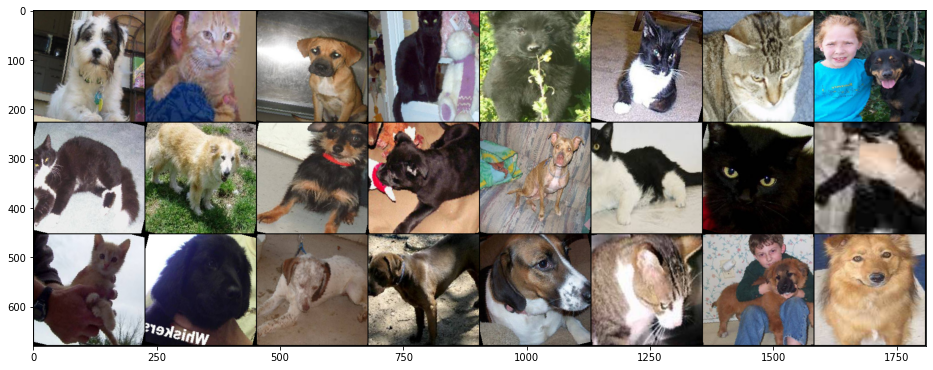

In [ ]:
# get a batch from the training set
samples, labels = iter(train_dataloader).next()
plt.figure(figsize=(16,24))
grid_images = torchvision.utils.make_grid(samples[:24])
np_grid_images = grid_images.numpy()
# in tensor, image is (batch, width, height), so we have to transpose it to 
# (width, height, batch) in numpy to show it
plt.imshow(np.transpose(np_grid_images, (1,2,0)))

# convert labels to animal types
values = ['Dog' if l == 1 else 'Cat' for l in labels[:24]]

# reshape list of labels to match image grid
def split_list(l, n):
    for i in range(0, len(l), n):
        yield l[i:i+n]

labels_list = list(split_list(values, 8))

for e in range(len(labels_list)):
  print(labels_list[e])

# Custom Models

In this assignment, we train two models on the cats and dogs dataset: VGG16 and ResNet50. For each model, we first freeze all the layers except the ones we replace and train the network, and then unfreeze all the layers and continue fine-tuning. Then, we modify the network in a different way and repeat the process. For VGG16, I initially replace the last output layer and the softmax layer with a new output layer and a sigmoid layer. In the second instance of VGG16, I replace all the layers in the model's classifier and add a sigmoid activation at the end. In the case of ResNet50, I initially replace the fully connected layer with a new layer and a sigmoid activation layer. For the second instance of ResNet50, I replace the fully connected layer with a fully connected layer and a fully connected output layer followed by sigmoid activation.

In [ ]:
def pretrained_model(type='vgg16', experiment=False):
  '''
  Function to obtain the desired model and load weights pretrained on ImageNet
  type: which model to obtain
  keep_last: whether to keep the last fully connected layer or replace it
  Returns the model with the pretrained weights frozen and the top layers 
  replaced with new layers for fine-tuning
  '''
  # VGG16 model
  if type == 'vgg16':
    # obtain pretrained VGG16 model
    model = models.vgg16(pretrained=True)

    # freeze all layers
    for param in model.parameters():
      param.requires_grad = False
    
    if experiment:
      # experiment with tossing out and replacing all the classifier layers
      
      # replace all the classifier layers
      # creating a new layer automatically sets requires_grad=True
      model.classifier[0] = nn.Linear(in_features=25088, out_features=256, 
                                      bias=True)
      model.classifier[3] = nn.Linear(in_features=256, out_features=256, 
                                      bias=True)
      model.classifier[6] = nn.Linear(in_features=256, out_features=1, 
                                      bias=True)
      
      # convert the sequence of layers to a list to be able to add the
      # sigmoid activation
      layers = list(model.classifier)
      layers.append(nn.Sigmoid())

      # unpack the list back into a sequence of layers
      model.classifier = nn.Sequential(*layers)
    
    else:
      # replace the last FC layer and the output layer with a new FC layer
      # and an output layer with sigmoid activation
  
      # replace the respective layers
      # creating a new layer automatically sets requires_grad=True
      model.classifier[3] = nn.Linear(in_features=4096, out_features=256, 
                                      bias=True)
      model.classifier[6] = nn.Linear(in_features=256, out_features=1, 
                                      bias=True)
      
      # convert the sequence of layers to a list to be able to add the
      # sigmoid activation
      layers = list(model.classifier)
      layers.append(nn.Sigmoid())
      
      # unpack the list back into a sequence of layers
      model.classifier = nn.Sequential(*layers)
  
  #ResNet50 Model
  elif type == 'resnet50':
    model = models.resnet50(pretrained=True)

    # freeze all layers
    for param in model.parameters():
      param.requires_grad = False
    
    if experiment:
      # replace the only FC layer with a new FC layer with ReLU activation and
      # an another FC layer with sigmoid activation
  
      # replace the FC layer with new layers
      # creating a new layer automatically sets requires_grad=True
      n_inputs = model.fc.in_features
      layers = []
      layers.append(nn.Linear(in_features=n_inputs, out_features=256, 
                              bias=True))
      layers.append(nn.ReLU(inplace=True))
      layers.append(nn.Dropout(p=0.5, inplace=False))
      layers.append(nn.Linear(in_features=256, out_features=1, bias=True))
      layers.append(nn.Sigmoid())
      
      # unpack the list into a sequence of layers
      model.fc = nn.Sequential(*layers)
    
    else:
      # replace the only FC layer with a new FC layer with sigmoid activation
  
      # replace the FC layer
      # creating a new layer automatically sets requires_grad=True
      n_inputs = model.fc.in_features
      layers = []
      layers.append(nn.Linear(in_features=n_inputs, out_features=1, bias=True))
      layers.append(nn.Sigmoid())
      
      # unpack the list into a sequence of layers
      model.fc = nn.Sequential(*layers)
  
  # move model to GPU if present
  model = model.to(device)

  # if multiple GPUs are being used, enable parallel processing
  if device == 'cuda':
    if multi_gpu:
      model = nn.DataParallel(model)
  
  return model

# VGG16

We fine-tune the VGG16 model with all layers frozen except the ones we would like to train on the cats and dogs dataset. In this instance, we are replacing the last FC layer and the output layer with new layers and sigmoid activation.

## Setup

In [ ]:
# obtain custom VGG16 model
vgg16 = pretrained_model('vgg16')
vgg16

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [ ]:
# print model summary for verification
if device == 'cuda':
  if multi_gpu:
    summary(
        vgg16.module,
        input_size=(3, 224, 224),
        batch_size=batch_size,
        device=device)
  else:
    summary(
        vgg16, input_size=(3, 224, 224), batch_size=batch_size, device=device)
else:
    summary(
        vgg16, input_size=(3, 224, 224), batch_size=batch_size, device=device)

Layer (type:depth-idx)                   Param #
├─Sequential: 1-1                        --
|    └─Conv2d: 2-1                       (1,792)
|    └─ReLU: 2-2                         --
|    └─Conv2d: 2-3                       (36,928)
|    └─ReLU: 2-4                         --
|    └─MaxPool2d: 2-5                    --
|    └─Conv2d: 2-6                       (73,856)
|    └─ReLU: 2-7                         --
|    └─Conv2d: 2-8                       (147,584)
|    └─ReLU: 2-9                         --
|    └─MaxPool2d: 2-10                   --
|    └─Conv2d: 2-11                      (295,168)
|    └─ReLU: 2-12                        --
|    └─Conv2d: 2-13                      (590,080)
|    └─ReLU: 2-14                        --
|    └─Conv2d: 2-15                      (590,080)
|    └─ReLU: 2-16                        --
|    └─MaxPool2d: 2-17                   --
|    └─Conv2d: 2-18                      (1,180,160)
|    └─ReLU: 2-19                        --
|    └─Conv2d: 2-

In [ ]:
# loss function to use; we use binary cross entropy loss since this is a
# two-class problem
vgg16_loss_fn = nn.BCELoss()
# optimizer to use; we use an Adam optimizer here
vgg16_optimizer = torch.optim.Adam(vgg16.parameters(), lr=lr)

In [ ]:
def train(model, loss_fn, optimizer, dataloader):
  '''
  Function to train the network using the training data for one epoch
  model: network to train
  loss_fn: loss function to use
  optimizer: algorithm to update the weights
  dataloader: training data
  Returns the training loss and accuracy for this epoch
  '''
  # number of training samples
  size = len(dataloader.dataset)
  # number of batches in set
  num_batches = len(dataloader)

  # initialize variables
  train_loss, correct, train_acc = 0.0, 0, 0.0

  # indicates intention to train; sets behavior for BatchNorm, Dropout, etc.
  model.train()

  # train model using mini-batches for each iteration
  for batch, (X, y) in enumerate(dataloader):
    # move data to GPU if available
    if device == 'cuda':
      X, y = X.to(device), y.unsqueeze(1).float().to(device)
      
    # clears gradients w.r.t. parameters
    optimizer.zero_grad()

    # forward propagation to get outputs from the network for the batch
    outputs = model(X)

    # calculate loss (binary cross entropy loss)
    loss = loss_fn(outputs, y)

    # add loss to training loss for epoch
    train_loss += loss.item()

    # computes gradients w.r.t. parameters (tensors)
    loss.backward()
    # updates gradients w.r.t. parameters using internally stored grad values
    # only updates layers that are not frozen
    optimizer.step()

    # calculate predictions from sigmoid outputs
    preds = outputs > 0.5
    # calculate number of correct predictions
    correct += (preds == y).sum()

    # track training progress
    if ((100 * (batch + 1)) / len(dataloader)) % 20 == 0:
      print(f'Batch:{batch+1}\tLoss: {loss.item():>7f}')
      print(f'{100 * (batch + 1) / len(dataloader)}% Complete\t' +
            f'[{(batch+1)*len(X):>5d}/{size:>5d}]')
  
  # average training loss
  train_loss /= num_batches
  # training accuracy
  train_acc = correct/size
  
  return train_loss, train_acc

In [ ]:
def validate(model, loss_fn, dataloader):
  '''
  Function to check network performance using the validation data
  model: network to validate
  loss_fn: loss function to use
  dataloader: validation data
  Returns the validation loss and accuracy
  '''
  # number of images in validation set
  size = len(dataloader.dataset)
  # number of batches in set
  num_batches = len(dataloader)

  # initialize variables
  val_loss, correct, val_acc = 0.0, 0, 0.0

  # indicates intention to test; sets behavior of BatchNorm, Dropout, etc.
  model.eval()

  # disable gradient calculation
  with torch.no_grad():
    # iterates through data in the dataloader
    for X, y in dataloader:
      # moves data to GPU if available
      if device == 'cuda':
        X, y = X.to(device), y.unsqueeze(1).float().to(device)
      
      # forward propagation to get outputs from the network for the batch
      outputs = model(X)

      # calculate loss (binary cross entropy loss)
      loss = loss_fn(outputs, y)

      # add loss to validation loss for epoch
      val_loss += loss.item()

      # calculate predictions from sigmoid outputs
      preds = outputs > 0.5
      # calculate number of correct predictions
      correct += (preds == y).sum()
    
  # average validation loss
  val_loss /= num_batches
  # validation accuracy
  val_acc = correct/size

  return val_loss, val_acc

In [ ]:
def test(model, dataloader):
  '''
  Function to check network performance on the test data
  model: network to test
  dataloader: test data
  Returns the test accuracy and predictions
  '''
  # number of images in validation set
  size = len(dataloader.dataset)
  # number of batches in set
  num_batches = len(dataloader)

  # initialize variables
  predictions = []
  correct, test_acc = 0, 0.0
  misclass = 0

  # indicates intention to test; sets behavior of BatchNorm, Dropout, etc.
  model.eval()

  # disable gradient calculation
  with torch.no_grad():
    # iterates through data in the dataloader
    for X, y in dataloader:
      # moves data to GPU if available
      if device == 'cuda':
        X, y = X.to(device), y.unsqueeze(1).float().to(device)
      
      # forward propagation to get outputs from the network for the batch
      outputs = model(X)

      # calculate predictions from sigmoid outputs
      preds = outputs > 0.5
      predictions.append(preds)
      # calculate number of correct predictions
      correct += (preds == y).sum()

      for idx in range(len(X)):
        if y[idx] != preds[idx]:
          misclass += 1
          if misclass <= 10:
            plt.imshow(X[idx].cpu().permute(1,2,0))
            pred_label = 'Dog' if preds[idx] == 1 else 'Cat'
            true_label = 'Dog' if y[idx] == 1 else 'Cat'
            plt.title("Predicted: {}".format(pred_label) + 
            "; True: {}".format(true_label))
            plt.show()

    
  # validation accuracy
  test_acc = correct/size

  return test_acc, predictions

In [ ]:
def fit(model, loss_fn, optimizer, train_dataloader, val_dataloader, 
        path, num_epochs=20):
  '''
  Function to train the network, implementing early stopping
  model: network to use
  loss_fn: loss function to use
  optimizer: algorithm to update the weights
  train_dataloader: training data
  val_dataloader: validation data
  path: path for location for best model
  num_epochs: max number of epochs to train the network
  Returns the best model and a list of results for each epoch
  '''
  # variables to hold best epoch number
  best_epoch = 0
  # variable to track minimum validation loss for saving best model
  min_val_loss = np.Inf
  # variable to track maximum validation accuracy
  max_val_acc = 0
  # list to hold results for each epoch
  results = []

  # number of epochs already trained (if using loaded in model weights)
  try:
    print(f'Model has previously been trained for: {model.epochs} epochs\n')
  except:
    model.epochs = 0
    print(f'Starting Training from Scratch\n')
  
  main_start = time.time()

  # train the model for the set number of epochs
  for epoch in range(num_epochs):
    # variables to track losses and accuracies for the epoch
    train_loss = 0.0
    train_acc = 0.0

    val_loss = 0.0
    val_acc = 0.0

    val_losses = []

    start = time.time()

    print(f"\nEpoch {epoch+1}\n----------------------------------------------")

    # train the network with the training data
    train_loss, train_acc = train(model, loss_fn, optimizer, train_dataloader)
    
    # increase the number of epochs run on the model by 1
    model.epochs += 1

    # validate the network
    val_loss, val_acc = validate(model, loss_fn, val_dataloader)

    # add results for this epoch to results list
    results.append([train_loss, train_acc, val_loss, val_acc])
    
    print(f'Training: \n Accuracy: {(100*train_acc):.2f}%\t' + 
          f'Loss: {train_loss:.4f}')
    print(f'Validation: \n Accuracy: {(100*val_acc):.2f}%\t' + 
          f'Loss: {val_loss:.4f}')
    
    # save best model if validation loss improves
    if val_loss < min_val_loss:
      print(f'\nValidation loss decreased ({min_val_loss:.4f} -> ' + 
            f'{val_loss:.4f})\nSaving model...\n')
      torch.save(model.state_dict(), path)
      # reset counter for early stopping
      num_no_improvement = 0
      # save values for the best model
      min_val_loss = val_loss
      max_val_acc = val_acc
      best_epoch = epoch+1

    if epoch > 4:
      moving_avg_loss = sum(val_losses[-5:])/5
      # if the threshold for early stopping is met (no improvement in
      # val loss compared to a 5-epoch moving average), trigger early stopping
      if val_loss > moving_avg_loss:
        print(f'\nEarly Stopping! Total epochs: {epoch+1}\n')
        break
    
    val_losses.append(val_loss)

    print(f'\n{(time.time() - start)/60:.2f} minutes elapsed in epoch\n')
  
  # load the best state dict
  model.load_state_dict(torch.load(path))
  # attach the optimizer
  model.optimizer = optimizer
  # record overall time and print out stats
  total_time = time.time() - main_start
  print(f'Best Epoch: {best_epoch} \n Loss: {min_val_loss:.4f}'+
        f'\tAccuracy: {100 * max_val_acc:.2f}%')
  print(f'\nTotal time: {total_time/60:.2f} minutes elapsed; ' + 
        f'{(total_time / (epoch+1))/60:.2f} minutes per epoch')

  # format results
  results = pd.DataFrame(results, columns=['train_loss', 'train_acc', 
                                           'val_loss', 'val_acc'])
  
  return model, results

## Train

In [ ]:
# fine-tune the model on cats and dogs data
vgg16, results = fit(vgg16, vgg16_loss_fn, vgg16_optimizer, train_dataloader, 
                     val_dataloader, path='vgg16.pt', num_epochs=num_epochs)

Starting Training from Scratch


Epoch 1
----------------------------------------------
Batch:100	Loss: 0.080560
20.0% Complete	[ 3200/16000]
Batch:200	Loss: 0.163852
40.0% Complete	[ 6400/16000]
Batch:300	Loss: 0.022015
60.0% Complete	[ 9600/16000]
Batch:400	Loss: 0.169345
80.0% Complete	[12800/16000]
Batch:500	Loss: 0.096204
100.0% Complete	[16000/16000]
Training: 
 Accuracy: 93.78%	Loss: 0.1546
Validation: 
 Accuracy: 96.95%	Loss: 0.0781

Validation loss decreased (inf -> 0.0781)
Saving model...


4.48 minutes elapsed in epoch


Epoch 2
----------------------------------------------
Batch:100	Loss: 0.065858
20.0% Complete	[ 3200/16000]
Batch:200	Loss: 0.119665
40.0% Complete	[ 6400/16000]
Batch:300	Loss: 0.408451
60.0% Complete	[ 9600/16000]
Batch:400	Loss: 0.034493
80.0% Complete	[12800/16000]
Batch:500	Loss: 0.204658
100.0% Complete	[16000/16000]
Training: 
 Accuracy: 95.44%	Loss: 0.1147
Validation: 
 Accuracy: 96.30%	Loss: 0.0864

4.44 minutes elapsed in epoch


Epoch 3
---------

## Training Results

### Plot of Losses

Text(0.5, 1.0, 'Training and Validation Losses')

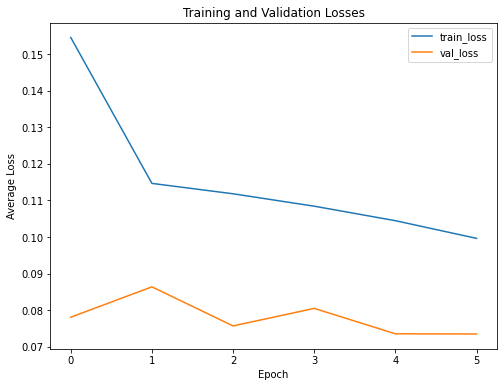

In [ ]:
plt.figure(figsize=(8, 6))
for c in ['train_loss', 'val_loss']:
    plt.plot(
        results[c], label=c)
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Average Loss')
plt.title('Training and Validation Losses')

We can see that the loss converges within 5 epochs since we are using pre-trained weights and only replacing the last FC layer and output activation layer. The training is stopped early to prevent overfitting.

### Plot of Accuracies

Text(0.5, 1.0, 'Training and Validation Accuracy')

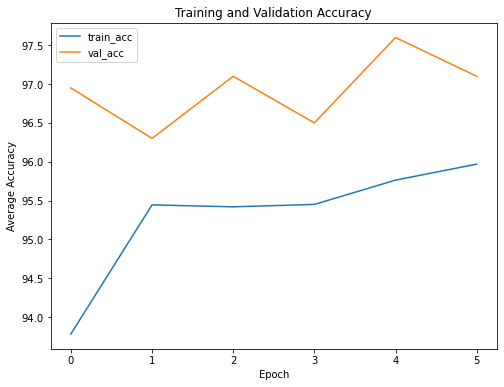

In [ ]:
plt.figure(figsize=(8, 6))
for c in ['train_acc', 'val_acc']:
    plt.plot(
        100 * results[c], label=c)
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Average Accuracy')
plt.title('Training and Validation Accuracy')

We can see that the training accuracy continues to increase with each epoch while the validation accuracy fluctuates and plateaus on average, as with the losses. The model achieves over 95% accuracy from the beginning, which indicates that the convolutional weights learned from ImageNet easily transferred to the cats and dogs dataset. The best model achieves 97.10% accuracy on the validation set, which is very good in context.

## Save Model

In [ ]:
def save_best_model(model, path):
    '''
    Function to save a PyTorch model checkpoint
    model: model to save
    path: location to save model; must start with `model_name_` 
          and end in '.pth'
    '''

    model_name = path.split('_')[0]
    assert (model_name in ['vgg16', 'resnet'
                           ]), "Path must have the correct model name"

    # details
    checkpoint = {
        'epochs': model.epochs
    }

    # extract the final classifier and the state dictionary
    if model_name == 'vgg16':
        # Check to see if model was parallelized
        if multi_gpu:
            checkpoint['classifier'] = model.module.classifier
            checkpoint['state_dict'] = model.module.state_dict()
        else:
            checkpoint['classifier'] = model.classifier
            checkpoint['state_dict'] = model.state_dict()

    elif model_name == 'resnet':
        if multi_gpu:
            checkpoint['fc'] = model.module.fc
            checkpoint['state_dict'] = model.module.state_dict()
        else:
            checkpoint['fc'] = model.fc
            checkpoint['state_dict'] = model.state_dict()

    # add the optimizer
    checkpoint['optimizer'] = model.optimizer
    checkpoint['optimizer_state_dict'] = model.optimizer.state_dict()

    # save the data to the path
    torch.save(checkpoint, path)

In [ ]:
save_best_model(vgg16, path='vgg16_.pth')

## Load Model

In [ ]:
def load_best_model(path):
    '''
    Function to load a PyTorch model checkpoint
    path: saved model path; must start with `model_name_` and end in '.pth'
    Returns the saved model and the optimizer
    '''

    # get the model name
    model_name = path.split('_')[0]
    assert (model_name in ['vgg16', 'resnet'
                           ]), "Path must have the correct model name"

    # load in checkpoint
    checkpoint = torch.load(path)

    if model_name == 'vgg16':
        model = models.vgg16(pretrained=True)
        # set parameters as not trainable
        for param in model.parameters():
            param.requires_grad = False
        model.classifier = checkpoint['classifier']

    elif model_name == 'resnet':
        model = models.resnet50(pretrained=True)
        # set parameters as not trainable
        for param in model.parameters():
            param.requires_grad = False
        model.fc = checkpoint['fc']

    # load in the state dict
    model.load_state_dict(checkpoint['state_dict'])

    # move model to GPU if available
    if device == 'cuda':
      model = model.to(device)
      if multi_gpu:
        model = nn.DataParallel(model)

    # model basics
    model.epochs = checkpoint['epochs']

    # optimizer
    optimizer = checkpoint['optimizer']
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])

    return model, optimizer

## Test Accuracy and Performance

In [ ]:
vgg16, vgg16_optimizer = load_best_model(path='vgg16_.pth')

Test Accuracy for VGG16


Misclassified:



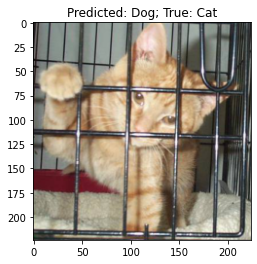

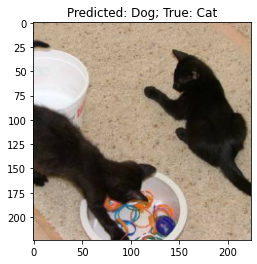

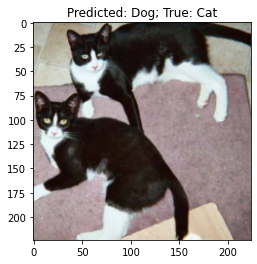

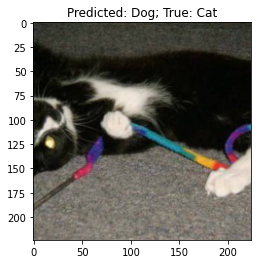

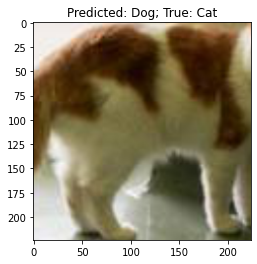

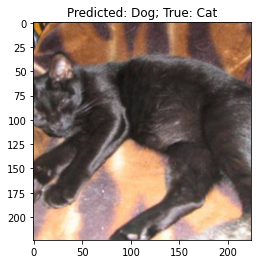

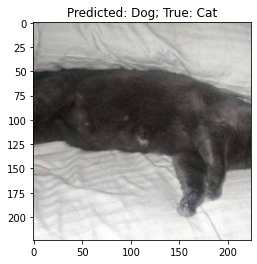

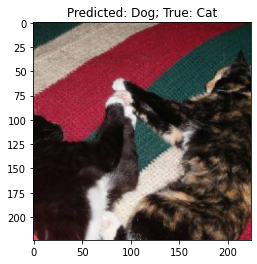

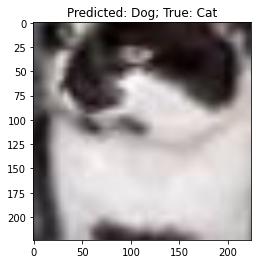

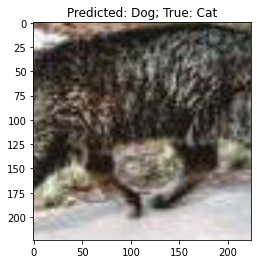

Test Accuracy: 96.30%


tensor([False, False, False,  ...,  True,  True, False], device='cuda:0')

In [ ]:
print('Test Accuracy for VGG16\n\n')
print('Misclassified:\n')
# calculate test accuracy and obtain label predictions
test_accuracy, predictions = test(vgg16, test_dataloader)
print(f'Test Accuracy: {100 * test_accuracy:.2f}%')
# predictions is populated in batches, so we are concatenating
# the results
predictions = torch.stack(predictions)
# flatten stacked results into a 1D array
predictions = predictions.reshape(1, -1).squeeze()
predictions.to(device)

## Plot Samples

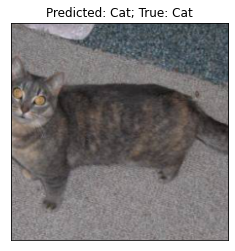

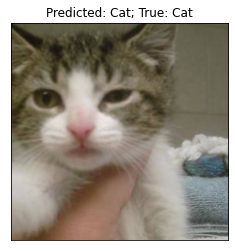

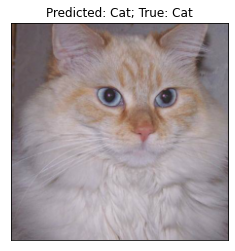

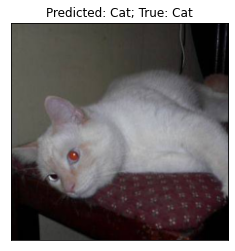

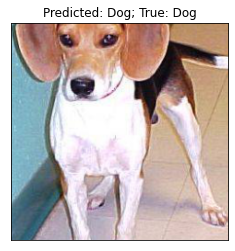

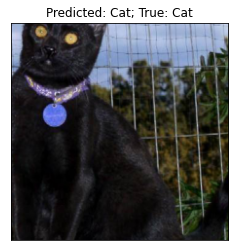

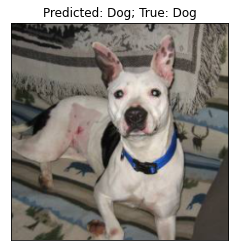

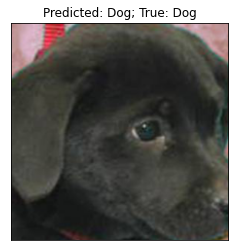

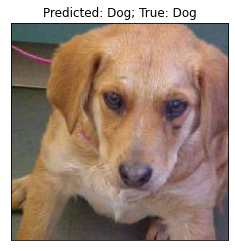

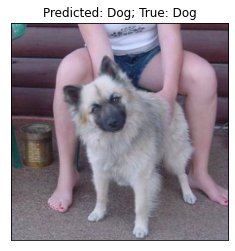

In [ ]:
# get 10 random indices for test data
sample_indices = torch.randint(len(test_set), (10,)).to(device)
# obtain subset of test data using the generated sample_indices
sample_test_data = Subset(test_set, sample_indices)
# wrap dataloader around sample_test_data
sample_test_dataloader = DataLoader(sample_test_data, batch_size=1, shuffle=False)
# obtain subset of predictions for test data samples
sample_predictions = torch.index_select(predictions, 0, sample_indices)
sample_predictions = ['Dog' if l == 1 else 'Cat' for l in sample_predictions]

# enumerate samples for visualization
samples = enumerate(sample_test_dataloader)

# visualize the 10 test data points randomly selected and plot the image with
# the predicted and true labels
for i in range(10):
  batch_idx, (img, label) = next(samples)
  plt.imshow(img[0].permute(1,2,0))
  label_val = 'Dog' if label[0] == 1 else 'Cat'
  plt.title("Predicted: {}".format(sample_predictions[i]) + 
            "; True: {}".format(label_val))
  plt.xticks([])
  plt.yticks([])
  plt.show()

# VGG16 Unfrozen

We fine-tune VGG16 with all layers unfrozen and trainable. The model is not trained from scratch, but rather continues from the best model obtained from earlier.

## Train

In [ ]:
vgg16, vgg16_optimizer = load_best_model(path='vgg16_.pth')

In [ ]:
# unfreeze all layers
for param in vgg16.parameters():
  param.requires_grad = True

In [ ]:
# print model summary for verification
if device == 'cuda':
  if multi_gpu:
    summary(
        vgg16.module,
        input_size=(3, 224, 224),
        batch_size=batch_size,
        device=device)
  else:
    summary(
        vgg16, input_size=(3, 224, 224), batch_size=batch_size, device=device)
else:
    summary(
        vgg16, input_size=(3, 224, 224), batch_size=batch_size, device=device)

Layer (type:depth-idx)                   Param #
├─Sequential: 1-1                        --
|    └─Conv2d: 2-1                       1,792
|    └─ReLU: 2-2                         --
|    └─Conv2d: 2-3                       36,928
|    └─ReLU: 2-4                         --
|    └─MaxPool2d: 2-5                    --
|    └─Conv2d: 2-6                       73,856
|    └─ReLU: 2-7                         --
|    └─Conv2d: 2-8                       147,584
|    └─ReLU: 2-9                         --
|    └─MaxPool2d: 2-10                   --
|    └─Conv2d: 2-11                      295,168
|    └─ReLU: 2-12                        --
|    └─Conv2d: 2-13                      590,080
|    └─ReLU: 2-14                        --
|    └─Conv2d: 2-15                      590,080
|    └─ReLU: 2-16                        --
|    └─MaxPool2d: 2-17                   --
|    └─Conv2d: 2-18                      1,180,160
|    └─ReLU: 2-19                        --
|    └─Conv2d: 2-20              

In [ ]:
# optimizer to use; we use an Adam optimizer here
vgg16_optimizer = torch.optim.Adam(vgg16.parameters(), lr=1e-5)

In [ ]:
# further fine-tune the model on cats and dogs data with layers unfrozen
vgg16, results = fit(vgg16, vgg16_loss_fn, vgg16_optimizer, train_dataloader, 
                     val_dataloader, path='vgg16_unfrozen.pt', 
                     num_epochs=num_epochs)

Model has previously been trained for: 6 epochs


Epoch 1
----------------------------------------------
Batch:100	Loss: 0.001063
20.0% Complete	[ 3200/16000]
Batch:200	Loss: 0.039234
40.0% Complete	[ 6400/16000]
Batch:300	Loss: 0.005264
60.0% Complete	[ 9600/16000]
Batch:400	Loss: 0.040850
80.0% Complete	[12800/16000]
Batch:500	Loss: 0.011755
100.0% Complete	[16000/16000]
Training: 
 Accuracy: 97.98%	Loss: 0.0529
Validation: 
 Accuracy: 98.40%	Loss: 0.0431

Validation loss decreased (inf -> 0.0431)
Saving model...


9.53 minutes elapsed in epoch


Epoch 2
----------------------------------------------
Batch:100	Loss: 0.000916
20.0% Complete	[ 3200/16000]
Batch:200	Loss: 0.284209
40.0% Complete	[ 6400/16000]
Batch:300	Loss: 0.004290
60.0% Complete	[ 9600/16000]
Batch:400	Loss: 0.001075
80.0% Complete	[12800/16000]
Batch:500	Loss: 0.181502
100.0% Complete	[16000/16000]
Training: 
 Accuracy: 98.80%	Loss: 0.0396
Validation: 
 Accuracy: 98.30%	Loss: 0.0392

Validation loss decreased (0.043

In [ ]:
save_best_model(vgg16, path='vgg16_unfrozen.pth')

## Training Results

### Plot of Losses

Text(0.5, 1.0, 'Training and Validation Losses')

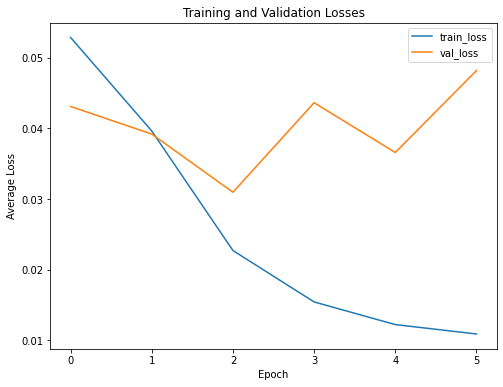

In [ ]:
plt.figure(figsize=(8, 6))
for c in ['train_loss', 'val_loss']:
    plt.plot(
        results[c], label=c)
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Average Loss')
plt.title('Training and Validation Losses')

We can see that the training loss continues to decrease while the validation loss converges within 5 epochs even when we unfreeze all the layers in the model. Fine-tuning the entire VGG16 model on the cats and dogs achieved 98.70% validation accuracy on the best model, which is better than the accuracy achieved with training only the replaced layers. The training is stopped early to prevent overfitting.

### Plot of Accuracies

Text(0.5, 1.0, 'Training and Validation Accuracy')

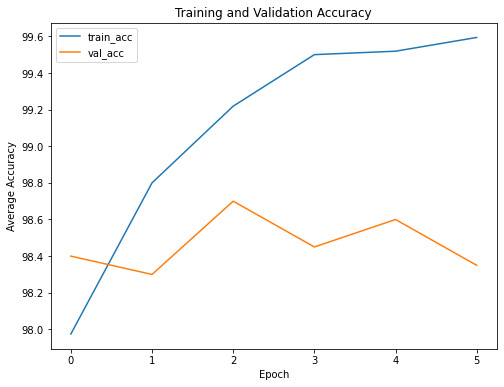

In [ ]:
plt.figure(figsize=(8, 6))
for c in ['train_acc', 'val_acc']:
    plt.plot(
        100 * results[c], label=c)
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Average Accuracy')
plt.title('Training and Validation Accuracy')

We can see that the training accuracy continues to increase with each epoch while the validation accuracy plateaus on average, as with the losses. This trend continues from the training of just the replaced layers and persists even when we unfreeze all the layers. The model achieves around 98% accuracy from the beginning, which indicates that the convolutional weights learned from ImageNet easily transferred to the cats and dogs dataset, and fine tuning them improved the accuracy even more than freezing those weights. The best model achieves 98.70% accuracy on the validation set, which is excellent.

## Test Accuracy and Performance

In [ ]:
vgg16, vgg16_optimizer = load_best_model(path='vgg16_unfrozen.pth')

Test Accuracy for VGG16 Unfrozen


Misclassified:



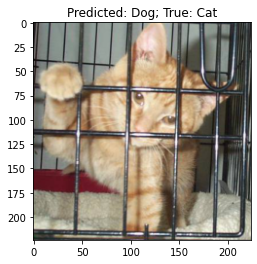

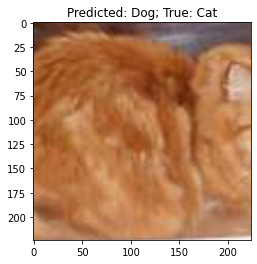

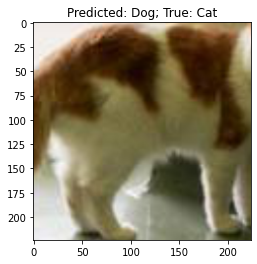

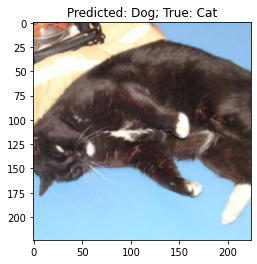

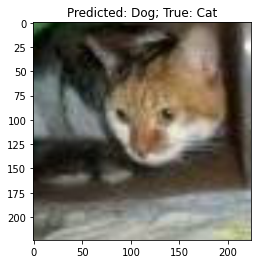

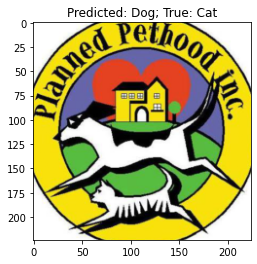

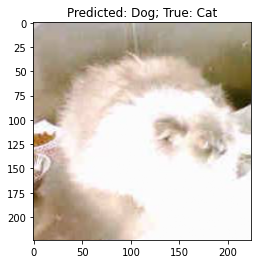

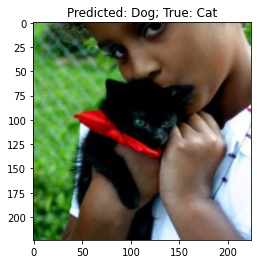

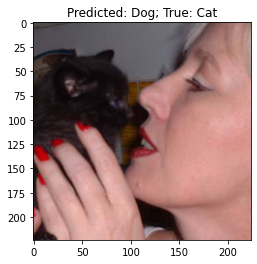

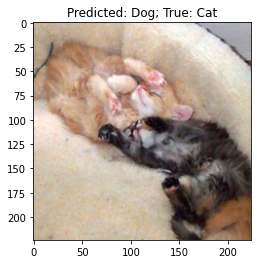

Test Accuracy: 98.85%


tensor([False, False, False,  ...,  True,  True, False], device='cuda:0')

In [ ]:
print('Test Accuracy for VGG16 Unfrozen\n\n')
print('Misclassified:\n')
# calculate test accuracy and obtain label predictions
test_accuracy, predictions = test(vgg16, test_dataloader)
print(f'Test Accuracy: {100 * test_accuracy:.2f}%')
# predictions is populated in batches, so we are concatenating
# the results
predictions = torch.stack(predictions)
# flatten stacked results into a 1D array
predictions = predictions.reshape(1, -1).squeeze()
predictions.to(device)

## Plot Samples

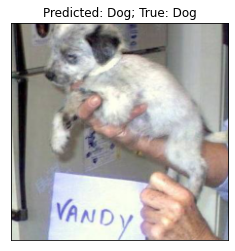

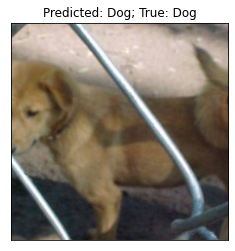

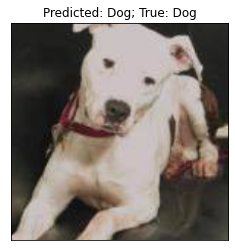

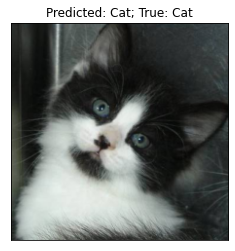

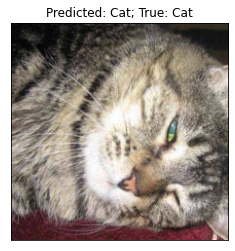

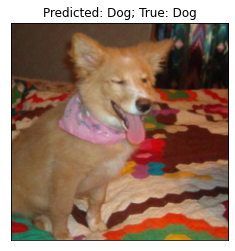

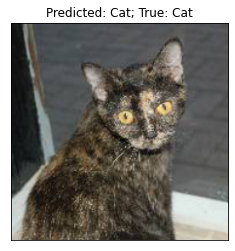

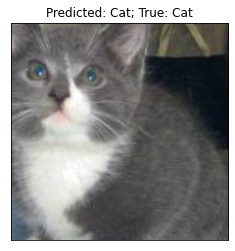

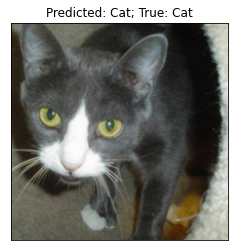

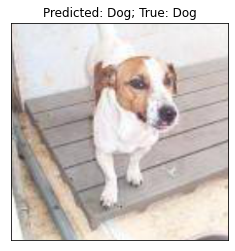

In [ ]:
# get 10 random indices for test data
sample_indices = torch.randint(len(test_set), (10,)).to(device)
# obtain subset of test data using the generated sample_indices
sample_test_data = Subset(test_set, sample_indices)
# wrap dataloader around sample_test_data
sample_test_dataloader = DataLoader(sample_test_data, batch_size=1, shuffle=False)
# obtain subset of predictions for test data samples
sample_predictions = torch.index_select(predictions, 0, sample_indices)
sample_predictions = ['Dog' if l == 1 else 'Cat' for l in sample_predictions]

# enumerate samples for visualization
samples = enumerate(sample_test_dataloader)

# visualize the 10 test data points randomly selected and plot the image with
# the predicted and true labels
for i in range(10):
  batch_idx, (img, label) = next(samples)
  plt.imshow(img[0].permute(1,2,0))
  label_val = 'Dog' if label[0] == 1 else 'Cat'
  plt.title("Predicted: {}".format(sample_predictions[i]) + 
            "; True: {}".format(label_val))
  plt.xticks([])
  plt.yticks([])
  plt.show()

# VGG16 Experiment

In this network surgery, I will replace all the classifier layers in VGG16 and train those new layers of the network on the cats and dogs data. Then, I will unfreeze the entire network and further fine-tune it and evaluate its performance.

## Setup

In [ ]:
# obtain custom VGG16 model for experiment
vgg16 = pretrained_model('vgg16', experiment=True)
vgg16

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [ ]:
# print model summary for verification
if device == 'cuda':
  if multi_gpu:
    summary(
        vgg16.module,
        input_size=(3, 224, 224),
        batch_size=batch_size,
        device=device)
  else:
    summary(
        vgg16, input_size=(3, 224, 224), batch_size=batch_size, device=device)
else:
    summary(
        vgg16, input_size=(3, 224, 224), batch_size=batch_size, device=device)

Layer (type:depth-idx)                   Param #
├─Sequential: 1-1                        --
|    └─Conv2d: 2-1                       (1,792)
|    └─ReLU: 2-2                         --
|    └─Conv2d: 2-3                       (36,928)
|    └─ReLU: 2-4                         --
|    └─MaxPool2d: 2-5                    --
|    └─Conv2d: 2-6                       (73,856)
|    └─ReLU: 2-7                         --
|    └─Conv2d: 2-8                       (147,584)
|    └─ReLU: 2-9                         --
|    └─MaxPool2d: 2-10                   --
|    └─Conv2d: 2-11                      (295,168)
|    └─ReLU: 2-12                        --
|    └─Conv2d: 2-13                      (590,080)
|    └─ReLU: 2-14                        --
|    └─Conv2d: 2-15                      (590,080)
|    └─ReLU: 2-16                        --
|    └─MaxPool2d: 2-17                   --
|    └─Conv2d: 2-18                      (1,180,160)
|    └─ReLU: 2-19                        --
|    └─Conv2d: 2-

In [ ]:
# loss function to use; we use binary cross entropy loss since this is a
# two-class problem
vgg16_loss_fn = nn.BCELoss()
# optimizer to use; we use an Adam optimizer here
vgg16_optimizer = torch.optim.Adam(vgg16.parameters(), lr=lr)

## Train

In [ ]:
# fine-tune the experiment model on cats and dogs data
vgg16, results = fit(vgg16, vgg16_loss_fn, vgg16_optimizer, train_dataloader, 
                     val_dataloader, path='vgg16_exp.pt', num_epochs=num_epochs)

Starting Training from Scratch


Epoch 1
----------------------------------------------
Batch:100	Loss: 0.074890
20.0% Complete	[ 3200/16000]
Batch:200	Loss: 0.248667
40.0% Complete	[ 6400/16000]
Batch:300	Loss: 0.048084
60.0% Complete	[ 9600/16000]
Batch:400	Loss: 0.056865
80.0% Complete	[12800/16000]
Batch:500	Loss: 0.096908
100.0% Complete	[16000/16000]
Training: 
 Accuracy: 93.91%	Loss: 0.1555
Validation: 
 Accuracy: 96.20%	Loss: 0.0809

Validation loss decreased (inf -> 0.0809)
Saving model...


4.34 minutes elapsed in epoch


Epoch 2
----------------------------------------------
Batch:100	Loss: 0.158446
20.0% Complete	[ 3200/16000]
Batch:200	Loss: 0.106344
40.0% Complete	[ 6400/16000]
Batch:300	Loss: 0.057840
60.0% Complete	[ 9600/16000]
Batch:400	Loss: 0.056132
80.0% Complete	[12800/16000]
Batch:500	Loss: 0.011723
100.0% Complete	[16000/16000]
Training: 
 Accuracy: 96.03%	Loss: 0.1015
Validation: 
 Accuracy: 96.80%	Loss: 0.0776

Validation loss decreased (0.0809 -> 0.0776)
Savi

In [ ]:
save_best_model(vgg16, path='vgg16_exp.pth')

## Training Results

### Plot of Losses

Text(0.5, 1.0, 'Training and Validation Losses')

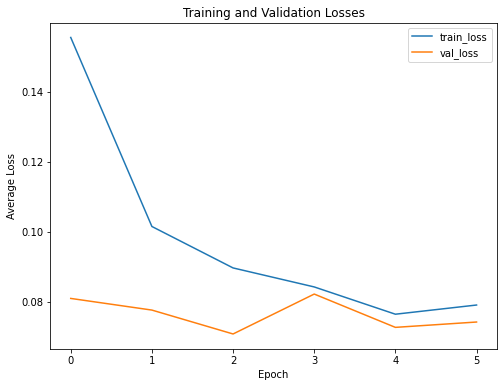

In [ ]:
plt.figure(figsize=(8, 6))
for c in ['train_loss', 'val_loss']:
    plt.plot(
        results[c], label=c)
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Average Loss')
plt.title('Training and Validation Losses')

We can see that the validation loss converges within 5 epochs and that it quickly plateaus and even begins to rise when we trigger early stopping. The overall loss, however, is slight higher when we replace the entire classifier section of the model than just the last layers. This may be due to the fact that the ImageNet weights transfer to the cats and dogs dataset easily and replacing them in the early classifier layers is removing some helpful weights for classification.

### Plot of Accuracies

Text(0.5, 1.0, 'Training and Validation Accuracy')

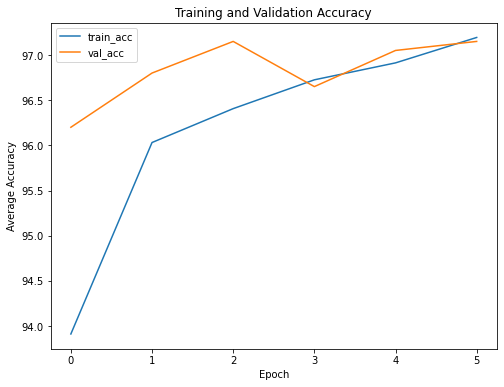

In [ ]:
plt.figure(figsize=(8, 6))
for c in ['train_acc', 'val_acc']:
    plt.plot(
        100 * results[c], label=c)
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Average Accuracy')
plt.title('Training and Validation Accuracy')

We can see that the training accuracy continues to increase with each epoch while the validation accuracy plateaus on average, as with the losses. While the trend is similar to training only the last layers in the model, we achieve a slightly higher accuracy when we replace all the classifier layers. The best model here achieves 97.15% validation accuracy while the best model in the first instance achieved 97.10% accuracy. However, the accuracies are so close that this indicates that retaining some of the ImageNet weights may be slightly less optimized for this dataset.

## Test Accuracy and Performance

In [ ]:
vgg16, vgg16_optimizer = load_best_model(path='vgg16_exp.pth')

Test Accuracy for VGG16 Experiment


Misclassified:



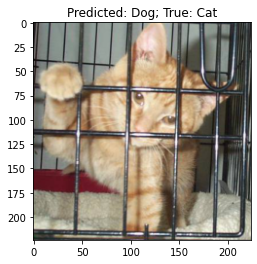

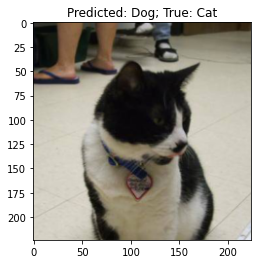

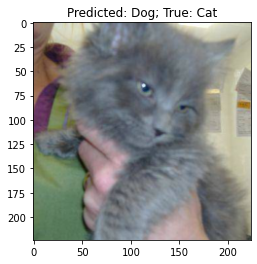

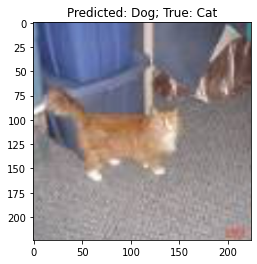

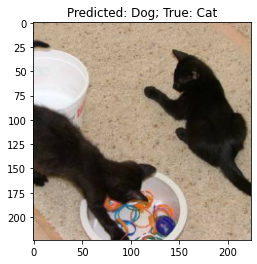

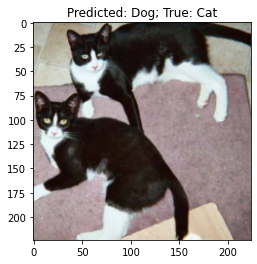

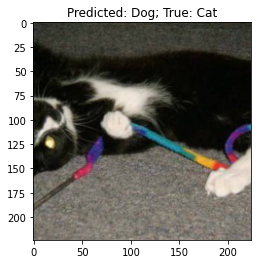

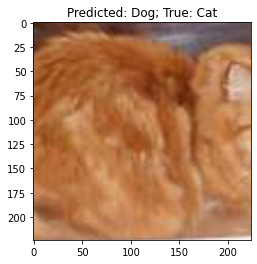

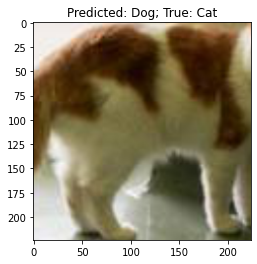

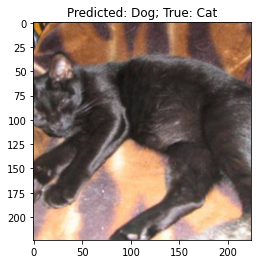

Test Accuracy: 96.30%


tensor([False, False, False,  ...,  True,  True, False], device='cuda:0')

In [ ]:
print('Test Accuracy for VGG16 Experiment\n\n')
print('Misclassified:\n')
# calculate test accuracy and obtain label predictions
test_accuracy, predictions = test(vgg16, test_dataloader)
print(f'Test Accuracy: {100 * test_accuracy:.2f}%')
# predictions is populated in batches, so we are concatenating
# the results
predictions = torch.stack(predictions)
# flatten stacked results into a 1D array
predictions = predictions.reshape(1, -1).squeeze()
predictions.to(device)

## Plot Samples

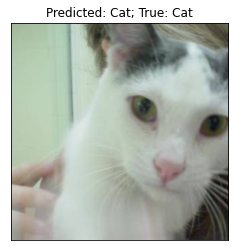

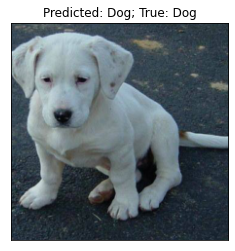

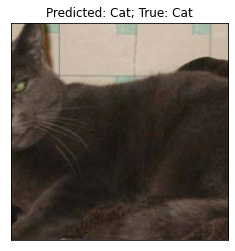

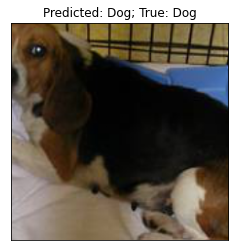

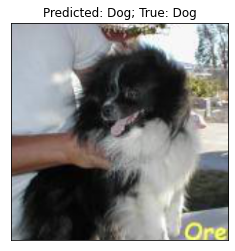

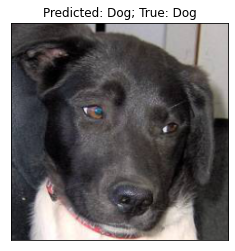

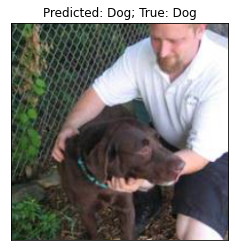

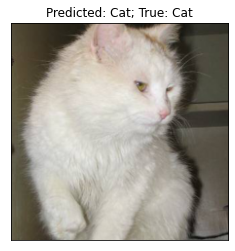

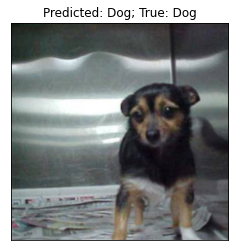

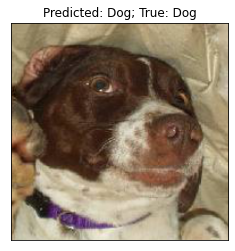

In [ ]:
# get 10 random indices for test data
sample_indices = torch.randint(len(test_set), (10,)).to(device)
# obtain subset of test data using the generated sample_indices
sample_test_data = Subset(test_set, sample_indices)
# wrap dataloader around sample_test_data
sample_test_dataloader = DataLoader(sample_test_data, batch_size=1, shuffle=False)
# obtain subset of predictions for test data samples
sample_predictions = torch.index_select(predictions, 0, sample_indices)
sample_predictions = ['Dog' if l == 1 else 'Cat' for l in sample_predictions]

# enumerate samples for visualization
samples = enumerate(sample_test_dataloader)

# visualize the 10 test data points randomly selected and plot the image with
# the predicted and true labels
for i in range(10):
  batch_idx, (img, label) = next(samples)
  plt.imshow(img[0].permute(1,2,0))
  label_val = 'Dog' if label[0] == 1 else 'Cat'
  plt.title("Predicted: {}".format(sample_predictions[i]) + 
            "; True: {}".format(label_val))
  plt.xticks([])
  plt.yticks([])
  plt.show()

# VGG16 Experiment Unfrozen

We fine-tune the experiment version of VGG16 with all layers unfrozen and trainable. The model is not trained from scratch, but rather continues from the best model obtained from the experiment VGG16.

## Train

In [ ]:
vgg16, vgg16_optimizer = load_best_model(path='vgg16_exp.pth')

In [ ]:
# unfreeze all layers
for param in vgg16.parameters():
  param.requires_grad = True

In [ ]:
# print model summary for verification
if device == 'cuda':
  if multi_gpu:
    summary(
        vgg16.module,
        input_size=(3, 224, 224),
        batch_size=batch_size,
        device=device)
  else:
    summary(
        vgg16, input_size=(3, 224, 224), batch_size=batch_size, device=device)
else:
    summary(
        vgg16, input_size=(3, 224, 224), batch_size=batch_size, device=device)

Layer (type:depth-idx)                   Param #
├─Sequential: 1-1                        --
|    └─Conv2d: 2-1                       1,792
|    └─ReLU: 2-2                         --
|    └─Conv2d: 2-3                       36,928
|    └─ReLU: 2-4                         --
|    └─MaxPool2d: 2-5                    --
|    └─Conv2d: 2-6                       73,856
|    └─ReLU: 2-7                         --
|    └─Conv2d: 2-8                       147,584
|    └─ReLU: 2-9                         --
|    └─MaxPool2d: 2-10                   --
|    └─Conv2d: 2-11                      295,168
|    └─ReLU: 2-12                        --
|    └─Conv2d: 2-13                      590,080
|    └─ReLU: 2-14                        --
|    └─Conv2d: 2-15                      590,080
|    └─ReLU: 2-16                        --
|    └─MaxPool2d: 2-17                   --
|    └─Conv2d: 2-18                      1,180,160
|    └─ReLU: 2-19                        --
|    └─Conv2d: 2-20              

In [ ]:
# optimizer to use; we use an Adam optimizer here
vgg16_optimizer = torch.optim.Adam(vgg16.parameters(), lr=1e-5)

In [ ]:
# further fine-tune the model on cats and dogs data with layers unfrozen
vgg16, results = fit(vgg16, vgg16_loss_fn, vgg16_optimizer, train_dataloader, 
                     val_dataloader, path='vgg16_exp_unfrozen.pt', 
                     num_epochs=num_epochs)

Model has previously been trained for: 6 epochs


Epoch 1
----------------------------------------------
Batch:100	Loss: 0.121341
20.0% Complete	[ 3200/16000]
Batch:200	Loss: 0.032169
40.0% Complete	[ 6400/16000]
Batch:300	Loss: 0.029688
60.0% Complete	[ 9600/16000]
Batch:400	Loss: 0.050374
80.0% Complete	[12800/16000]
Batch:500	Loss: 0.033142
100.0% Complete	[16000/16000]
Training: 
 Accuracy: 98.11%	Loss: 0.0554
Validation: 
 Accuracy: 98.35%	Loss: 0.0401

Validation loss decreased (inf -> 0.0401)
Saving model...


8.85 minutes elapsed in epoch


Epoch 2
----------------------------------------------
Batch:100	Loss: 0.120987
20.0% Complete	[ 3200/16000]
Batch:200	Loss: 0.000475
40.0% Complete	[ 6400/16000]
Batch:300	Loss: 0.026119
60.0% Complete	[ 9600/16000]
Batch:400	Loss: 0.005659
80.0% Complete	[12800/16000]
Batch:500	Loss: 0.071232
100.0% Complete	[16000/16000]
Training: 
 Accuracy: 98.83%	Loss: 0.0323
Validation: 
 Accuracy: 98.50%	Loss: 0.0366

Validation loss decreased (0.040

In [ ]:
save_best_model(vgg16, path='vgg16_exp_unfrozen.pth')

## Training Results

### Plot of Losses

Text(0.5, 1.0, 'Training and Validation Losses')

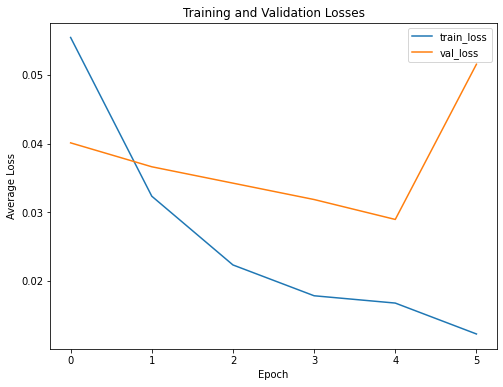

In [ ]:
plt.figure(figsize=(8, 6))
for c in ['train_loss', 'val_loss']:
    plt.plot(
        results[c], label=c)
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Average Loss')
plt.title('Training and Validation Losses')

We can see that the validation loss converges within 5 epochs and that it plateaus on average. The overall loss, however, is slight higher when we replace the entire classifier section of the model than just the last layers, even when we unfreeze all the layers. As before, the ImageNet weights for the replaced classifier layers may be causing the slight difference is losses between the two experiments.

### Plot of Accuracies

Text(0.5, 1.0, 'Training and Validation Accuracy')

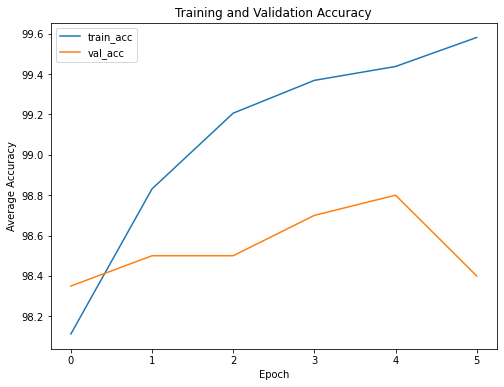

In [ ]:
plt.figure(figsize=(8, 6))
for c in ['train_acc', 'val_acc']:
    plt.plot(
        100 * results[c], label=c)
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Average Accuracy')
plt.title('Training and Validation Accuracy')

We can see that the training accuracy continues to increase with each epoch while the validation accuracy plateaus on average and even begins to increase, as with the losses. While the trend is similar to training only the last layers in the model, we achieve a slightly higher accuracy when we replace all the classifier layers, even when all the weights are unfrozen. The best model here achieves 98.80% validation accuracy while the best model in the first instance achieved 98.70% accuracy. This indicates that retaining some of the ImageNet weights may be slightly less optimized for this dataset, affirming the previous results.

## Test Accuracy and Performance

In [ ]:
vgg16, vgg16_optimizer = load_best_model(path='vgg16_exp_unfrozen.pth')

Test Accuracy for VGG16 Experiment Unfrozen


Misclassified:



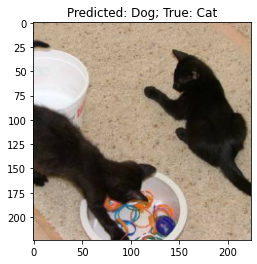

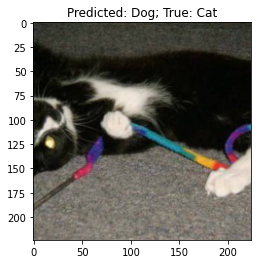

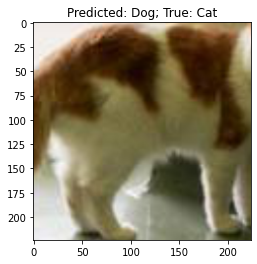

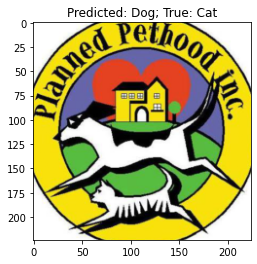

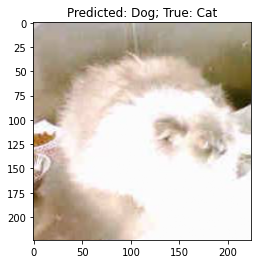

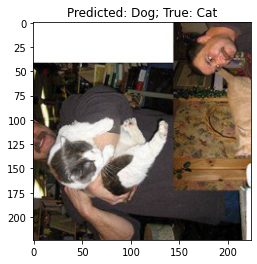

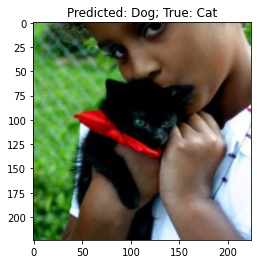

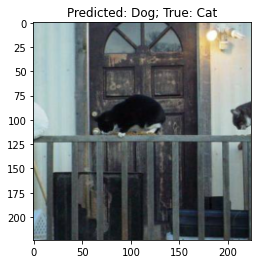

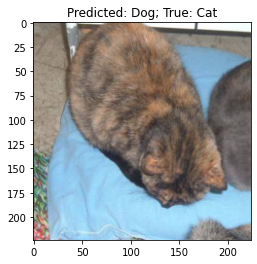

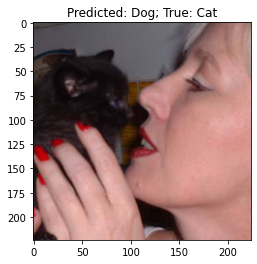

Test Accuracy: 98.70%


tensor([False, False, False,  ...,  True,  True, False], device='cuda:0')

In [ ]:
print('Test Accuracy for VGG16 Experiment Unfrozen\n\n')
print('Misclassified:\n')
# calculate test accuracy and obtain label predictions
test_accuracy, predictions = test(vgg16, test_dataloader)
print(f'Test Accuracy: {100 * test_accuracy:.2f}%')
# predictions is populated in batches, so we are concatenating
# the results
predictions = torch.stack(predictions)
# flatten stacked results into a 1D array
predictions = predictions.reshape(1, -1).squeeze()
predictions.to(device)

## Plot Samples

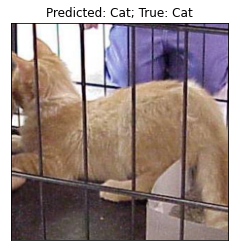

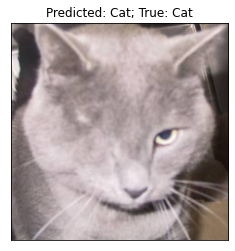

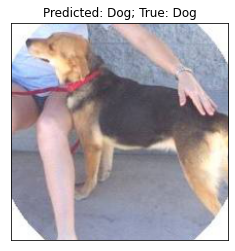

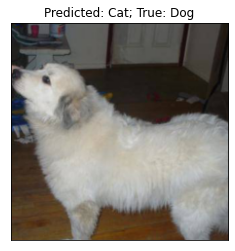

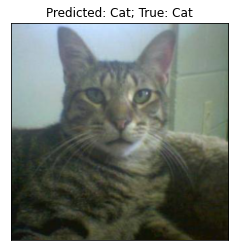

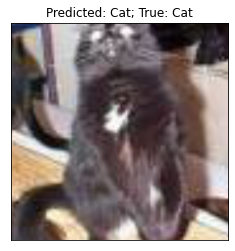

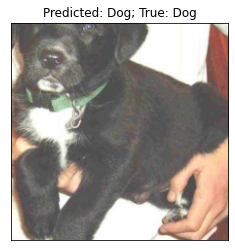

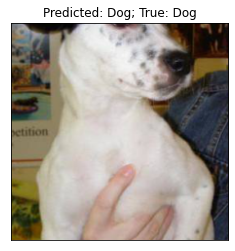

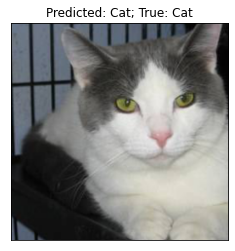

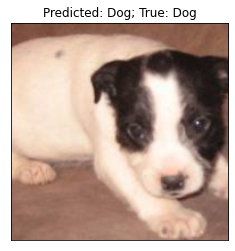

In [ ]:
# get 10 random indices for test data
sample_indices = torch.randint(len(test_set), (10,)).to(device)
# obtain subset of test data using the generated sample_indices
sample_test_data = Subset(test_set, sample_indices)
# wrap dataloader around sample_test_data
sample_test_dataloader = DataLoader(sample_test_data, batch_size=1, shuffle=False)
# obtain subset of predictions for test data samples
sample_predictions = torch.index_select(predictions, 0, sample_indices)
sample_predictions = ['Dog' if l == 1 else 'Cat' for l in sample_predictions]

# enumerate samples for visualization
samples = enumerate(sample_test_dataloader)

# visualize the 10 test data points randomly selected and plot the image with
# the predicted and true labels
for i in range(10):
  batch_idx, (img, label) = next(samples)
  plt.imshow(img[0].permute(1,2,0))
  label_val = 'Dog' if label[0] == 1 else 'Cat'
  plt.title("Predicted: {}".format(sample_predictions[i]) + 
            "; True: {}".format(label_val))
  plt.xticks([])
  plt.yticks([])
  plt.show()

# VGG16 Experiments Discussion

The two transfer learning experiments performed on VGG16 with the cats and dogs dataset involved replacing just the last FC layer and output layer in one instance and replacing all the classifier layers in the other instance. With all the layers except the replaced layers frozen in each instance, the experiments achieved test accuracies of 97.10% and 97.15% on the two experiments, respectively. When the layers were unfrozen and the models further fine-tuned, test accuracies of 98.70% and 98.80% were achieved, respectively. We can see that both experiments perform really well, indicating that the ImageNet weights transfer well to the cats and dogs dataset. We can also see that the second experiment performed slightly better, indicating that retaining some of the ImageNet classifier layers is slightly less optimized for this data. Overall, however, both perform nearly equally well.

# ResNet50

I will repeat the above experiments with ResNet50. In the first instance, I will replace the only FC layer in ResNet50 with a new FC layer and a sigmoid activation layer. In the second instance, I will replace the only FC layer with two FC layers, with the first followed by ReLU activation and the second by sigmoid activation. 

## Setup

In [ ]:
# obtain custom ResNet model
resnet = pretrained_model('resnet50')
resnet

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [ ]:
# print model summary for verification
if device == 'cuda':
  if multi_gpu:
    summary(
        resnet.module,
        input_size=(3, 224, 224),
        batch_size=batch_size,
        device=device)
  else:
    summary(
        resnet, input_size=(3, 224, 224), batch_size=batch_size, device=device)
else:
    summary(
        resnet, input_size=(3, 224, 224), batch_size=batch_size, device=device)

Layer (type:depth-idx)                   Param #
├─Conv2d: 1-1                            (9,408)
├─BatchNorm2d: 1-2                       (128)
├─ReLU: 1-3                              --
├─MaxPool2d: 1-4                         --
├─Sequential: 1-5                        --
|    └─Bottleneck: 2-1                   --
|    |    └─Conv2d: 3-1                  (4,096)
|    |    └─BatchNorm2d: 3-2             (128)
|    |    └─Conv2d: 3-3                  (36,864)
|    |    └─BatchNorm2d: 3-4             (128)
|    |    └─Conv2d: 3-5                  (16,384)
|    |    └─BatchNorm2d: 3-6             (512)
|    |    └─ReLU: 3-7                    --
|    |    └─Sequential: 3-8              (16,896)
|    └─Bottleneck: 2-2                   --
|    |    └─Conv2d: 3-9                  (16,384)
|    |    └─BatchNorm2d: 3-10            (128)
|    |    └─Conv2d: 3-11                 (36,864)
|    |    └─BatchNorm2d: 3-12            (128)
|    |    └─Conv2d: 3-13                 (16,384)
|    | 

In [ ]:
# loss function to use; we use binary cross entropy loss since this is a
# two-class problem
resnet_loss_fn = nn.BCELoss()
# optimizer to use; we use an Adam optimizer here
resnet_optimizer = torch.optim.Adam(resnet.parameters(), lr=lr)

## Train

In [ ]:
# fine-tune the ResNet model on cats and dogs data
resnet, results = fit(resnet, resnet_loss_fn, resnet_optimizer, train_dataloader, 
                     val_dataloader, path='resnet_.pt', num_epochs=num_epochs)

Starting Training from Scratch


Epoch 1
----------------------------------------------
Batch:100	Loss: 0.420197
20.0% Complete	[ 3200/16000]
Batch:200	Loss: 0.302872
40.0% Complete	[ 6400/16000]
Batch:300	Loss: 0.309875
60.0% Complete	[ 9600/16000]
Batch:400	Loss: 0.210287
80.0% Complete	[12800/16000]
Batch:500	Loss: 0.159316
100.0% Complete	[16000/16000]
Training: 
 Accuracy: 92.99%	Loss: 0.3157
Validation: 
 Accuracy: 97.15%	Loss: 0.1568

Validation loss decreased (inf -> 0.1568)
Saving model...


3.72 minutes elapsed in epoch


Epoch 2
----------------------------------------------
Batch:100	Loss: 0.168656
20.0% Complete	[ 3200/16000]
Batch:200	Loss: 0.172860
40.0% Complete	[ 6400/16000]
Batch:300	Loss: 0.131213
60.0% Complete	[ 9600/16000]
Batch:400	Loss: 0.149282
80.0% Complete	[12800/16000]
Batch:500	Loss: 0.081970
100.0% Complete	[16000/16000]
Training: 
 Accuracy: 96.45%	Loss: 0.1457
Validation: 
 Accuracy: 97.95%	Loss: 0.1023

Validation loss decreased (0.1568 -> 0.1023)
Savi

In [ ]:
save_best_model(resnet, path='resnet_.pth')

## Training Results

### Plot of Losses

Text(0.5, 1.0, 'Training and Validation Losses')

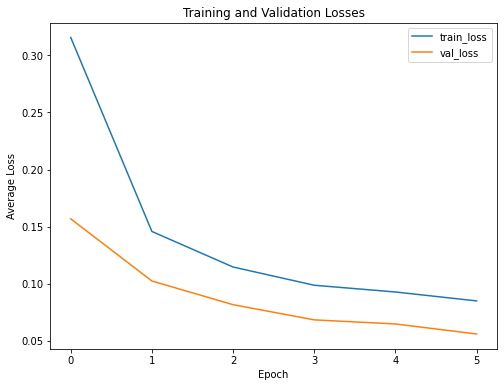

In [ ]:
plt.figure(figsize=(8, 6))
for c in ['train_loss', 'val_loss']:
    plt.plot(
        results[c], label=c)
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Average Loss')
plt.title('Training and Validation Losses')

We can see that the validation loss begins to plateau when we stop training. While we may have stopped a little early, it seems to have converged and thus wouldn't affect the results much.

### Plot of Accuracies

Text(0.5, 1.0, 'Training and Validation Accuracy')

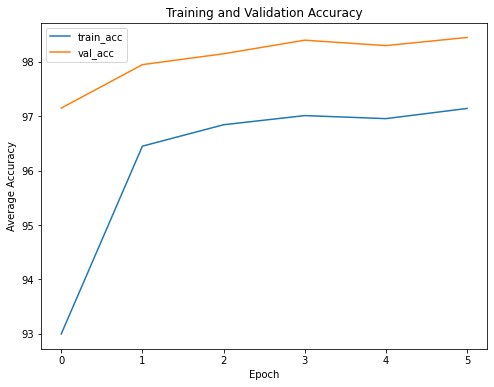

In [ ]:
plt.figure(figsize=(8, 6))
for c in ['train_acc', 'val_acc']:
    plt.plot(
        100 * results[c], label=c)
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Average Accuracy')
plt.title('Training and Validation Accuracy')

We can see that the training accuracy continues to increase with each epoch while the validation accuracy increases initially and then plateaus. The best model achieves 98.45% accuracy, which is better than what VGG16 achieves in the corresponding experiment. As before, the model maintains a high accuracy from the beginning, staying over 97%, indicating that the ImageNet weights transfer well to this data.

## Test Accuracy and Performance

In [ ]:
resnet, resnet_optimizer = load_best_model(path='resnet_.pth')

Test Accuracy for ResNet50


Misclassified:



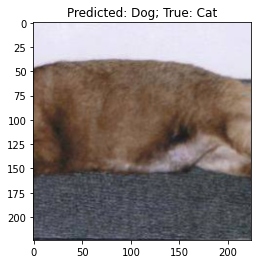

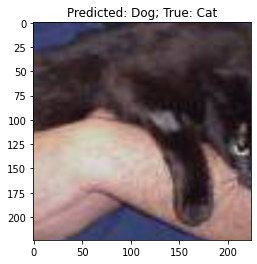

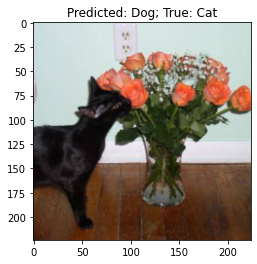

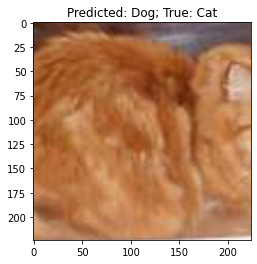

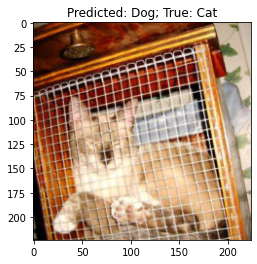

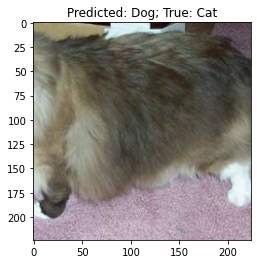

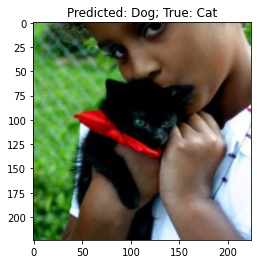

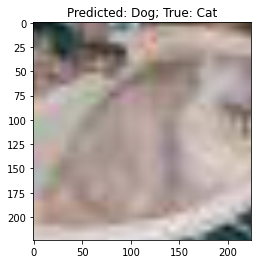

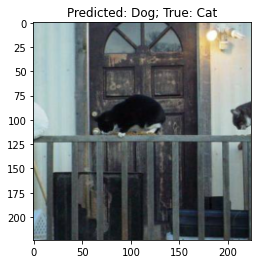

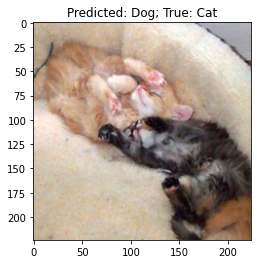

Test Accuracy: 98.85%


tensor([False, False, False,  ...,  True,  True,  True], device='cuda:0')

In [ ]:
print('Test Accuracy for ResNet50\n\n')
print('Misclassified:\n')
# calculate test accuracy and obtain label predictions
test_accuracy, predictions = test(resnet, test_dataloader)
print(f'Test Accuracy: {100 * test_accuracy:.2f}%')
# predictions is populated in batches, so we are concatenating
# the results
predictions = torch.stack(predictions)
# flatten stacked results into a 1D array
predictions = predictions.reshape(1, -1).squeeze()
predictions.to(device)

## Plot Samples

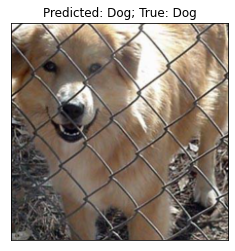

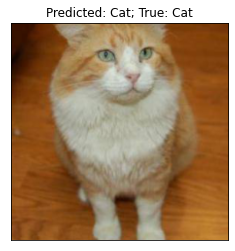

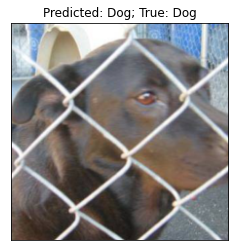

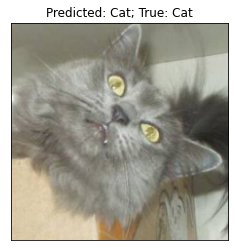

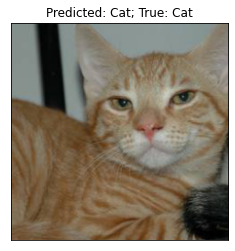

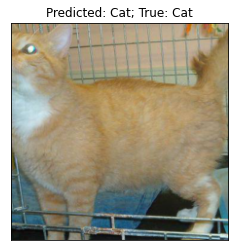

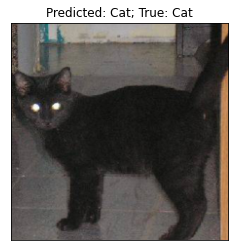

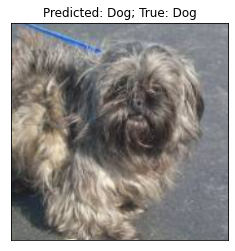

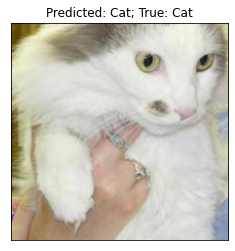

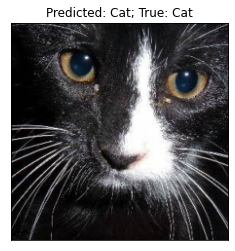

In [ ]:
# get 10 random indices for test data
sample_indices = torch.randint(len(test_set), (10,)).to(device)
# obtain subset of test data using the generated sample_indices
sample_test_data = Subset(test_set, sample_indices)
# wrap dataloader around sample_test_data
sample_test_dataloader = DataLoader(sample_test_data, batch_size=1, shuffle=False)
# obtain subset of predictions for test data samples
sample_predictions = torch.index_select(predictions, 0, sample_indices)
sample_predictions = ['Dog' if l == 1 else 'Cat' for l in sample_predictions]

# enumerate samples for visualization
samples = enumerate(sample_test_dataloader)

# visualize the 10 test data points randomly selected and plot the image with
# the predicted and true labels
for i in range(10):
  batch_idx, (img, label) = next(samples)
  plt.imshow(img[0].permute(1,2,0))
  label_val = 'Dog' if label[0] == 1 else 'Cat'
  plt.title("Predicted: {}".format(sample_predictions[i]) + 
            "; True: {}".format(label_val))
  plt.xticks([])
  plt.yticks([])
  plt.show()

# ResNet50 Unfrozen

We fine-tune ResNet50 with all layers unfrozen and trainable. The model is not trained from scratch, but rather continues from the best model obtained from earlier.

## Train

In [ ]:
resnet, resnet_optimizer = load_best_model(path='resnet_.pth')

In [ ]:
# unfreeze all layers
for param in resnet.parameters():
  param.requires_grad = True

In [ ]:
# print model summary for verification
if device == 'cuda':
  if multi_gpu:
    summary(
        resnet.module,
        input_size=(3, 224, 224),
        batch_size=batch_size,
        device=device)
  else:
    summary(
        resnet, input_size=(3, 224, 224), batch_size=batch_size, device=device)
else:
    summary(
        resnet, input_size=(3, 224, 224), batch_size=batch_size, device=device)

Layer (type:depth-idx)                   Param #
├─Conv2d: 1-1                            9,408
├─BatchNorm2d: 1-2                       128
├─ReLU: 1-3                              --
├─MaxPool2d: 1-4                         --
├─Sequential: 1-5                        --
|    └─Bottleneck: 2-1                   --
|    |    └─Conv2d: 3-1                  4,096
|    |    └─BatchNorm2d: 3-2             128
|    |    └─Conv2d: 3-3                  36,864
|    |    └─BatchNorm2d: 3-4             128
|    |    └─Conv2d: 3-5                  16,384
|    |    └─BatchNorm2d: 3-6             512
|    |    └─ReLU: 3-7                    --
|    |    └─Sequential: 3-8              16,896
|    └─Bottleneck: 2-2                   --
|    |    └─Conv2d: 3-9                  16,384
|    |    └─BatchNorm2d: 3-10            128
|    |    └─Conv2d: 3-11                 36,864
|    |    └─BatchNorm2d: 3-12            128
|    |    └─Conv2d: 3-13                 16,384
|    |    └─BatchNorm2d: 3-14      

In [ ]:
# optimizer to use; we use an Adam optimizer here
resnet_optimizer = torch.optim.Adam(resnet.parameters(), lr=1e-5)

In [ ]:
# further fine-tune the model on cats and dogs data with layers unfrozen
resnet, results = fit(resnet, resnet_loss_fn, resnet_optimizer, 
                      train_dataloader, val_dataloader, 
                      path='resnet_unfrozen.pt', num_epochs=num_epochs)

Model has previously been trained for: 6 epochs


Epoch 1
----------------------------------------------
Batch:100	Loss: 0.001088
20.0% Complete	[ 3200/16000]
Batch:200	Loss: 0.013278
40.0% Complete	[ 6400/16000]
Batch:300	Loss: 0.006320
60.0% Complete	[ 9600/16000]
Batch:400	Loss: 0.019885
80.0% Complete	[12800/16000]
Batch:500	Loss: 0.012266
100.0% Complete	[16000/16000]
Training: 
 Accuracy: 98.93%	Loss: 0.0332
Validation: 
 Accuracy: 99.35%	Loss: 0.0182

Validation loss decreased (inf -> 0.0182)
Saving model...


7.73 minutes elapsed in epoch


Epoch 2
----------------------------------------------
Batch:100	Loss: 0.001376
20.0% Complete	[ 3200/16000]
Batch:200	Loss: 0.178058
40.0% Complete	[ 6400/16000]
Batch:300	Loss: 0.008838
60.0% Complete	[ 9600/16000]
Batch:400	Loss: 0.004276
80.0% Complete	[12800/16000]
Batch:500	Loss: 0.019129
100.0% Complete	[16000/16000]
Training: 
 Accuracy: 99.20%	Loss: 0.0217
Validation: 
 Accuracy: 99.15%	Loss: 0.0208

7.71 minutes elapsed in epoch




In [ ]:
save_best_model(resnet, path='resnet_unfrozen.pth')

## Training Results

### Plot of Losses

Text(0.5, 1.0, 'Training and Validation Losses')

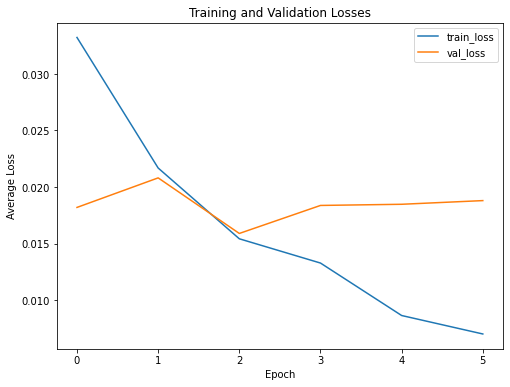

In [ ]:
plt.figure(figsize=(8, 6))
for c in ['train_loss', 'val_loss']:
    plt.plot(
        results[c], label=c)
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Average Loss')
plt.title('Training and Validation Losses')

We can see that the training loss continues to decrease while the validation loss converges within 5 epochs even when we unfreeze all the layers in the model. Fine-tuning the entire ResNet model on the cats and dogs achieved 99.25% validation accuracy on the best model, which is better than the accuracy achieved with training only the replaced layers. This is the best validation accuracy achieved thus far.

### Plot of Accuracies

Text(0.5, 1.0, 'Training and Validation Accuracy')

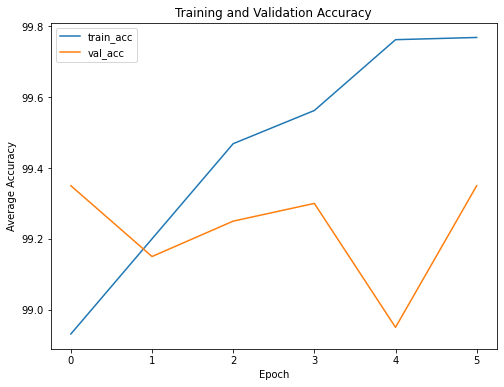

In [ ]:
plt.figure(figsize=(8, 6))
for c in ['train_acc', 'val_acc']:
    plt.plot(
        100 * results[c], label=c)
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Average Accuracy')
plt.title('Training and Validation Accuracy')

We can see that the training accuracy continues to increase with each epoch while the validation accuracy plateaus on average, as with the losses. This trend is consistent with all the other experiments, justifying the early stopping used for training. The best model here achieves 99.25% validation accuracy, which is excellent.

## Test Accuracy and Performance

In [ ]:
resnet, resnet_optimizer = load_best_model(path='resnet_unfrozen.pth')

Test Accuracy for ResNet50 Unfrozen


Misclassified:



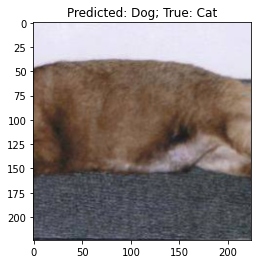

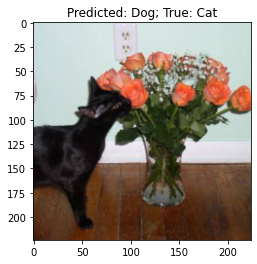

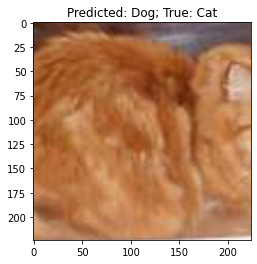

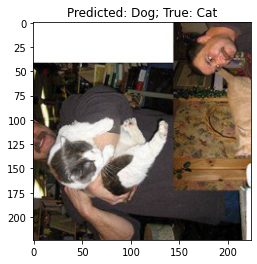

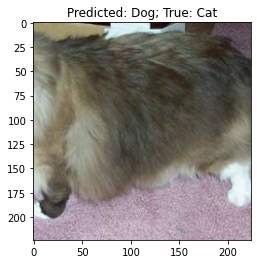

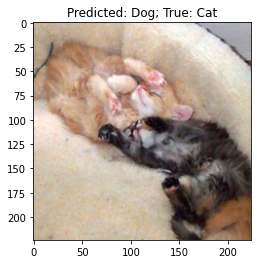

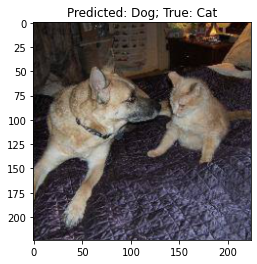

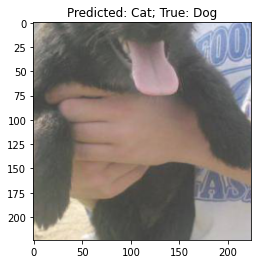

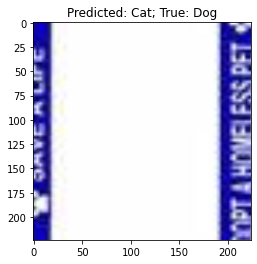

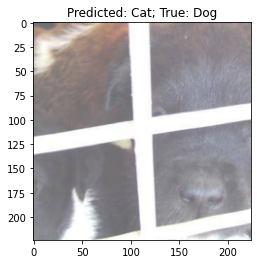

Test Accuracy: 98.85%


tensor([False, False, False,  ...,  True,  True,  True], device='cuda:0')

In [ ]:
print('Test Accuracy for ResNet50 Unfrozen\n\n')
print('Misclassified:\n')
# calculate test accuracy and obtain label predictions
test_accuracy, predictions = test(resnet, test_dataloader)
print(f'Test Accuracy: {100 * test_accuracy:.2f}%')
# predictions is populated in batches, so we are concatenating
# the results
predictions = torch.stack(predictions)
# flatten stacked results into a 1D array
predictions = predictions.reshape(1, -1).squeeze()
predictions.to(device)

## Plot Samples

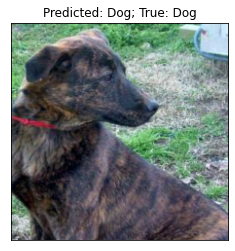

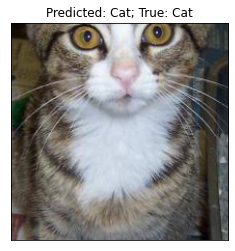

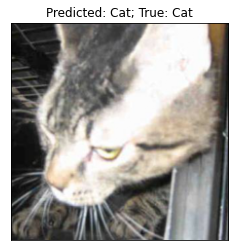

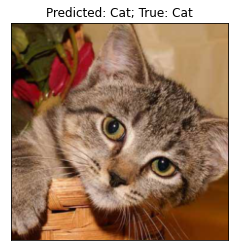

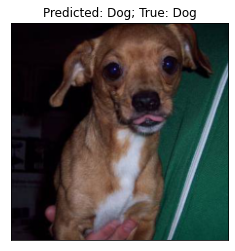

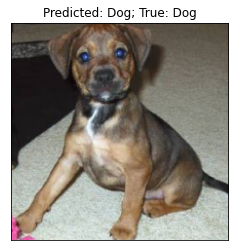

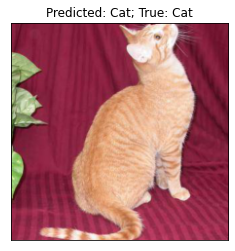

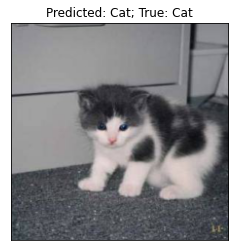

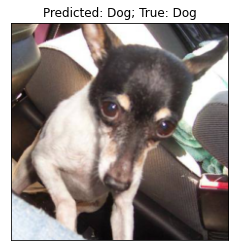

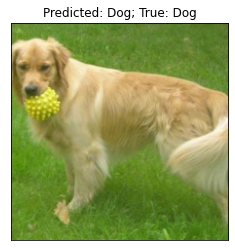

In [ ]:
# get 10 random indices for test data
sample_indices = torch.randint(len(test_set), (10,)).to(device)
# obtain subset of test data using the generated sample_indices
sample_test_data = Subset(test_set, sample_indices)
# wrap dataloader around sample_test_data
sample_test_dataloader = DataLoader(sample_test_data, batch_size=1, shuffle=False)
# obtain subset of predictions for test data samples
sample_predictions = torch.index_select(predictions, 0, sample_indices)
sample_predictions = ['Dog' if l == 1 else 'Cat' for l in sample_predictions]

# enumerate samples for visualization
samples = enumerate(sample_test_dataloader)

# visualize the 10 test data points randomly selected and plot the image with
# the predicted and true labels
for i in range(10):
  batch_idx, (img, label) = next(samples)
  plt.imshow(img[0].permute(1,2,0))
  label_val = 'Dog' if label[0] == 1 else 'Cat'
  plt.title("Predicted: {}".format(sample_predictions[i]) + 
            "; True: {}".format(label_val))
  plt.xticks([])
  plt.yticks([])
  plt.show()

# ResNet50 Experiment

In this network surgery, I will replace the FC layer in ResNet50 with two FC layers, one with ReLU activation and the second with Sigmoid activation. I will train the new layers of the network on the cats and dogs data. Then, I will unfreeze the entire network and further fine-tune it and evaluate its performance.

## Setup

In [ ]:
# obtain custom ResNet50 model for experiment
resnet = pretrained_model('resnet50', experiment=True)
resnet

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [ ]:
# print model summary for verification
if device == 'cuda':
  if multi_gpu:
    summary(
        resnet.module,
        input_size=(3, 224, 224),
        batch_size=batch_size,
        device=device)
  else:
    summary(
        resnet, input_size=(3, 224, 224), batch_size=batch_size, device=device)
else:
    summary(
        resnet, input_size=(3, 224, 224), batch_size=batch_size, device=device)

Layer (type:depth-idx)                   Param #
├─Conv2d: 1-1                            (9,408)
├─BatchNorm2d: 1-2                       (128)
├─ReLU: 1-3                              --
├─MaxPool2d: 1-4                         --
├─Sequential: 1-5                        --
|    └─Bottleneck: 2-1                   --
|    |    └─Conv2d: 3-1                  (4,096)
|    |    └─BatchNorm2d: 3-2             (128)
|    |    └─Conv2d: 3-3                  (36,864)
|    |    └─BatchNorm2d: 3-4             (128)
|    |    └─Conv2d: 3-5                  (16,384)
|    |    └─BatchNorm2d: 3-6             (512)
|    |    └─ReLU: 3-7                    --
|    |    └─Sequential: 3-8              (16,896)
|    └─Bottleneck: 2-2                   --
|    |    └─Conv2d: 3-9                  (16,384)
|    |    └─BatchNorm2d: 3-10            (128)
|    |    └─Conv2d: 3-11                 (36,864)
|    |    └─BatchNorm2d: 3-12            (128)
|    |    └─Conv2d: 3-13                 (16,384)
|    | 

In [ ]:
# loss function to use; we use binary cross entropy loss since this is a
# two-class problem
resnet_loss_fn = nn.BCELoss()
# optimizer to use; we use an Adam optimizer here
resnet_optimizer = torch.optim.Adam(resnet.parameters(), lr=lr)

## Train

In [ ]:
# fine-tune the ResNet50 experiment model on cats and dogs data
resnet, results = fit(resnet, resnet_loss_fn, resnet_optimizer, train_dataloader, 
                     val_dataloader, path='resnet_exp.pt', num_epochs=num_epochs)

Starting Training from Scratch


Epoch 1
----------------------------------------------
Batch:100	Loss: 0.179490
20.0% Complete	[ 3200/16000]
Batch:200	Loss: 0.055913
40.0% Complete	[ 6400/16000]
Batch:300	Loss: 0.074864
60.0% Complete	[ 9600/16000]
Batch:400	Loss: 0.035308
80.0% Complete	[12800/16000]
Batch:500	Loss: 0.073617
100.0% Complete	[16000/16000]
Training: 
 Accuracy: 94.79%	Loss: 0.1569
Validation: 
 Accuracy: 98.35%	Loss: 0.0543

Validation loss decreased (inf -> 0.0543)
Saving model...


3.77 minutes elapsed in epoch


Epoch 2
----------------------------------------------
Batch:100	Loss: 0.035582
20.0% Complete	[ 3200/16000]
Batch:200	Loss: 0.300413
40.0% Complete	[ 6400/16000]
Batch:300	Loss: 0.109825
60.0% Complete	[ 9600/16000]
Batch:400	Loss: 0.071222
80.0% Complete	[12800/16000]
Batch:500	Loss: 0.152448
100.0% Complete	[16000/16000]
Training: 
 Accuracy: 96.99%	Loss: 0.0799
Validation: 
 Accuracy: 98.55%	Loss: 0.0436

Validation loss decreased (0.0543 -> 0.0436)
Savi

In [ ]:
save_best_model(resnet, path='resnet_exp.pth')

## Training Results

### Plot of Losses

Text(0.5, 1.0, 'Training and Validation Losses')

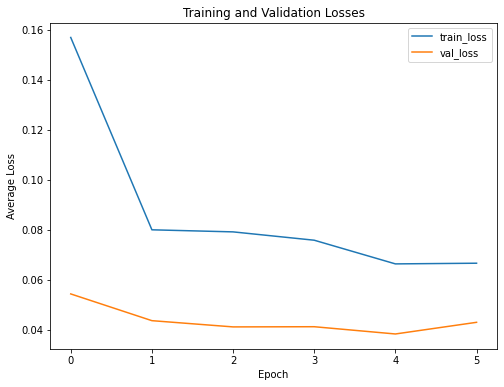

In [ ]:
plt.figure(figsize=(8, 6))
for c in ['train_loss', 'val_loss']:
    plt.plot(
        results[c], label=c)
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Average Loss')
plt.title('Training and Validation Losses')

We can see that the validation loss converges within 5 epochs and that it quickly plateaus and even begins to rise when we trigger early stopping. The extra fully connected layer in this instance is lowering the average loss from the first instance, an indication that the classifier layers are learning this data slightly better than with just one layer.

### Plot of Accuracies

Text(0.5, 1.0, 'Training and Validation Accuracy')

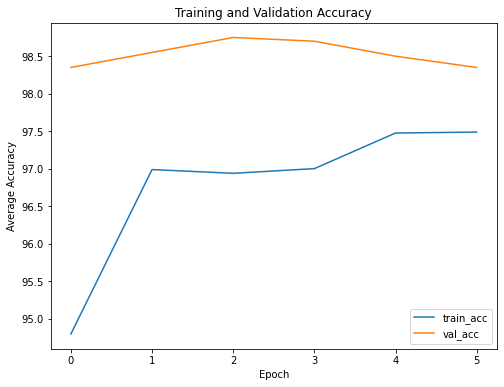

In [ ]:
plt.figure(figsize=(8, 6))
for c in ['train_acc', 'val_acc']:
    plt.plot(
        100 * results[c], label=c)
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Average Accuracy')
plt.title('Training and Validation Accuracy')

We can see that the training accuracy continues to increase with each epoch while the validation accuracy plateaus on average. While the trend is similar to training with just one fc layer, we achieve a slightly higher accuracy when we add a second fc layer. The best model here achieves 98.50% validation accuracy while the best model in the first instance achieved 98.45% accuracy. This indicates that the second fc layer helps the model learn the cats and dogs data slightly better.

## Test Accuracy and Performance

In [ ]:
resnet, resnet_optimizer = load_best_model(path='resnet_exp.pth')

Test Accuracy for ResNet50 Experiment


Misclassified:



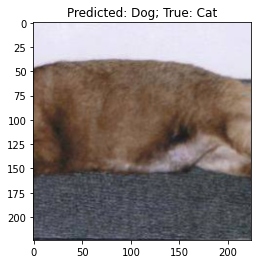

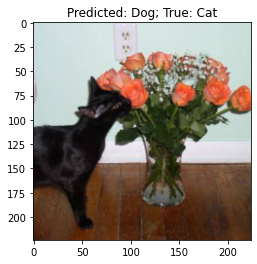

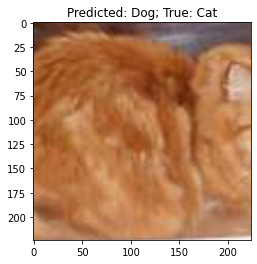

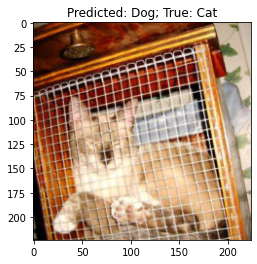

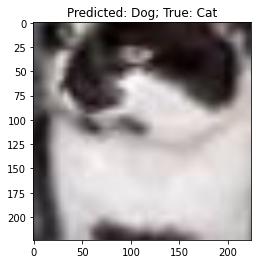

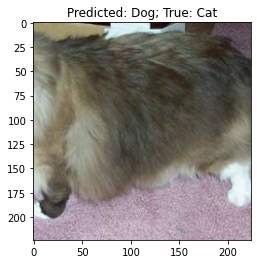

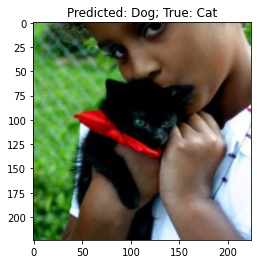

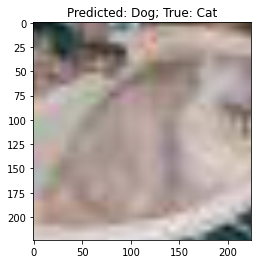

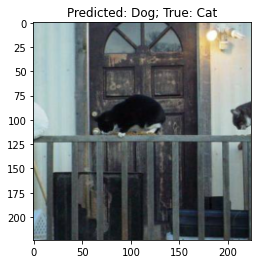

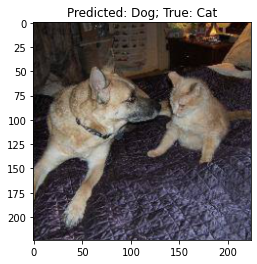

Test Accuracy: 97.95%


tensor([False, False, False,  ...,  True,  True,  True], device='cuda:0')

In [ ]:
print('Test Accuracy for ResNet50 Experiment\n\n')
print('Misclassified:\n')
# calculate test accuracy and obtain label predictions
test_accuracy, predictions = test(resnet, test_dataloader)
print(f'Test Accuracy: {100 * test_accuracy:.2f}%')
# predictions is populated in batches, so we are concatenating
# the results
predictions = torch.stack(predictions)
# flatten stacked results into a 1D array
predictions = predictions.reshape(1, -1).squeeze()
predictions.to(device)

## Plot Samples

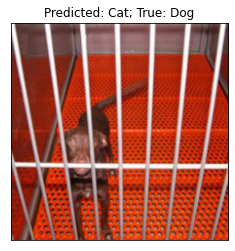

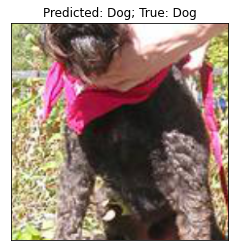

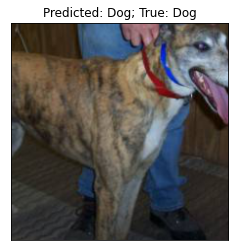

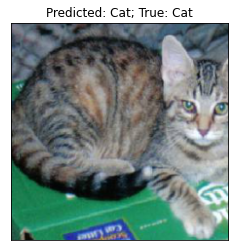

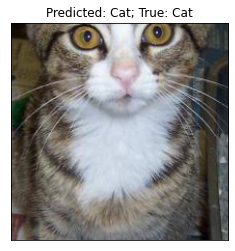

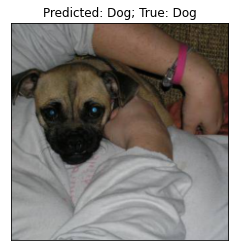

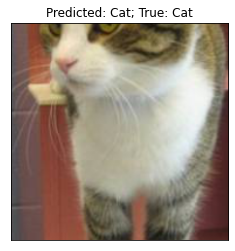

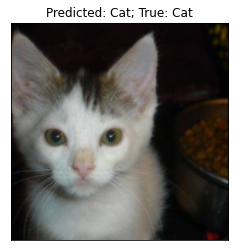

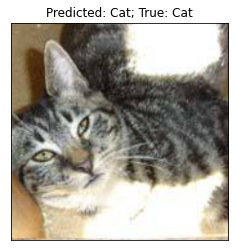

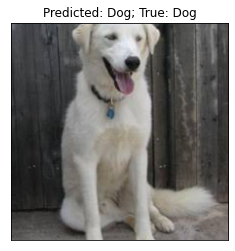

In [ ]:
# get 10 random indices for test data
sample_indices = torch.randint(len(test_set), (10,)).to(device)
# obtain subset of test data using the generated sample_indices
sample_test_data = Subset(test_set, sample_indices)
# wrap dataloader around sample_test_data
sample_test_dataloader = DataLoader(sample_test_data, batch_size=1, shuffle=False)
# obtain subset of predictions for test data samples
sample_predictions = torch.index_select(predictions, 0, sample_indices)
sample_predictions = ['Dog' if l == 1 else 'Cat' for l in sample_predictions]

# enumerate samples for visualization
samples = enumerate(sample_test_dataloader)

# visualize the 10 test data points randomly selected and plot the image with
# the predicted and true labels
for i in range(10):
  batch_idx, (img, label) = next(samples)
  plt.imshow(img[0].permute(1,2,0))
  label_val = 'Dog' if label[0] == 1 else 'Cat'
  plt.title("Predicted: {}".format(sample_predictions[i]) + 
            "; True: {}".format(label_val))
  plt.xticks([])
  plt.yticks([])
  plt.show()

# ResNet50 Experiment Unfrozen

We fine-tune the experiment version of ResNet50 with all layers unfrozen and trainable. The model is not trained from scratch, but rather continues from the best model obtained from the experiment ResNet50.

## Train

In [ ]:
resnet, resnet_optimizer = load_best_model(path='resnet_exp.pth')

In [ ]:
# unfreeze all layers
for param in resnet.parameters():
  param.requires_grad = True

In [ ]:
# print model summary for verification
if device == 'cuda':
  if multi_gpu:
    summary(
        resnet.module,
        input_size=(3, 224, 224),
        batch_size=batch_size,
        device=device)
  else:
    summary(
        resnet, input_size=(3, 224, 224), batch_size=batch_size, device=device)
else:
    summary(
        resnet, input_size=(3, 224, 224), batch_size=batch_size, device=device)

Layer (type:depth-idx)                   Param #
├─Conv2d: 1-1                            9,408
├─BatchNorm2d: 1-2                       128
├─ReLU: 1-3                              --
├─MaxPool2d: 1-4                         --
├─Sequential: 1-5                        --
|    └─Bottleneck: 2-1                   --
|    |    └─Conv2d: 3-1                  4,096
|    |    └─BatchNorm2d: 3-2             128
|    |    └─Conv2d: 3-3                  36,864
|    |    └─BatchNorm2d: 3-4             128
|    |    └─Conv2d: 3-5                  16,384
|    |    └─BatchNorm2d: 3-6             512
|    |    └─ReLU: 3-7                    --
|    |    └─Sequential: 3-8              16,896
|    └─Bottleneck: 2-2                   --
|    |    └─Conv2d: 3-9                  16,384
|    |    └─BatchNorm2d: 3-10            128
|    |    └─Conv2d: 3-11                 36,864
|    |    └─BatchNorm2d: 3-12            128
|    |    └─Conv2d: 3-13                 16,384
|    |    └─BatchNorm2d: 3-14      

In [ ]:
# optimizer to use; we use an Adam optimizer here
resnet_optimizer = torch.optim.Adam(resnet.parameters(), lr=1e-5)

In [ ]:
# further fine-tune the model on cats and dogs data with layers unfrozen
resnet, results = fit(resnet, resnet_loss_fn, resnet_optimizer, train_dataloader, 
                     val_dataloader, path='resnet_exp_unfrozen.pt', 
                     num_epochs=num_epochs)

Model has previously been trained for: 6 epochs


Epoch 1
----------------------------------------------
Batch:100	Loss: 0.184887
20.0% Complete	[ 3200/16000]
Batch:200	Loss: 0.081554
40.0% Complete	[ 6400/16000]
Batch:300	Loss: 0.009564
60.0% Complete	[ 9600/16000]
Batch:400	Loss: 0.060283
80.0% Complete	[12800/16000]
Batch:500	Loss: 0.045179
100.0% Complete	[16000/16000]
Training: 
 Accuracy: 98.11%	Loss: 0.0491
Validation: 
 Accuracy: 99.30%	Loss: 0.0221

Validation loss decreased (inf -> 0.0221)
Saving model...


7.84 minutes elapsed in epoch


Epoch 2
----------------------------------------------
Batch:100	Loss: 0.134892
20.0% Complete	[ 3200/16000]
Batch:200	Loss: 0.294641
40.0% Complete	[ 6400/16000]
Batch:300	Loss: 0.007471
60.0% Complete	[ 9600/16000]
Batch:400	Loss: 0.001091
80.0% Complete	[12800/16000]
Batch:500	Loss: 0.022679
100.0% Complete	[16000/16000]
Training: 
 Accuracy: 98.99%	Loss: 0.0280
Validation: 
 Accuracy: 99.15%	Loss: 0.0213

Validation loss decreased (0.022

In [ ]:
save_best_model(resnet, path='resnet_exp_unfrozen.pth')

## Training Results

### Plot of Losses

Text(0.5, 1.0, 'Training and Validation Losses')

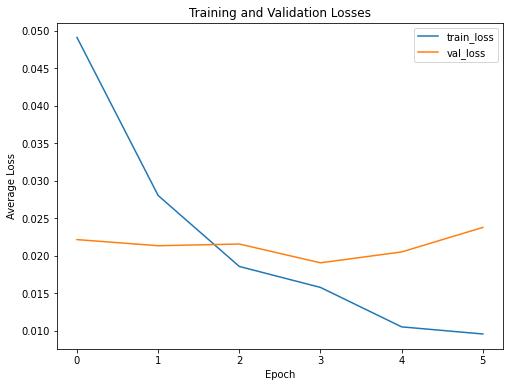

In [ ]:
plt.figure(figsize=(8, 6))
for c in ['train_loss', 'val_loss']:
    plt.plot(
        results[c], label=c)
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Average Loss')
plt.title('Training and Validation Losses')

We can see that the validation loss converges within 5 epochs and that it plateaus on average. With all the layers unfrozen in the instance with two layers added, the loss is similar to the loss for ResNet50 unfrozen with only one layer added. This shows that adding a second layer only slightly helps the model.

### Plot of Accuracies

Text(0.5, 1.0, 'Training and Validation Accuracy')

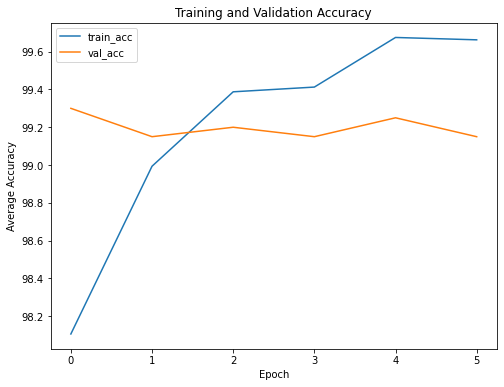

In [ ]:
plt.figure(figsize=(8, 6))
for c in ['train_acc', 'val_acc']:
    plt.plot(
        100 * results[c], label=c)
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Average Accuracy')
plt.title('Training and Validation Accuracy')

We can see that the training accuracy continues to increase with each epoch while the validation accuracy plateaus on average. The trend stays consistent throughout all the experiments, as expected. We achieve 99.15% validation accuracy here,which compares almost equally to the 99.25% accuracy achieved on ResNet50 with only one layer added. The difference is too small to claim adding a second layer makes a difference.

## Test Accuracy and Performance

Test Accuracy for ResNet50 Experiment Unfrozen


Misclassified:



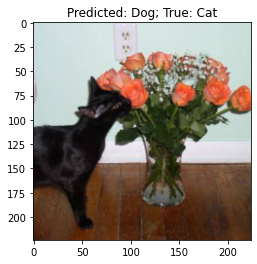

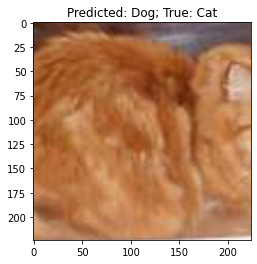

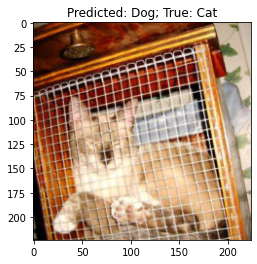

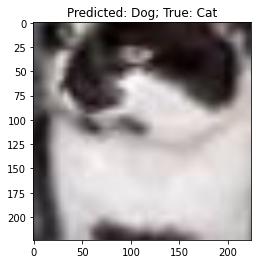

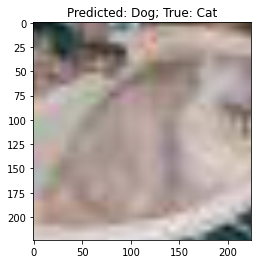

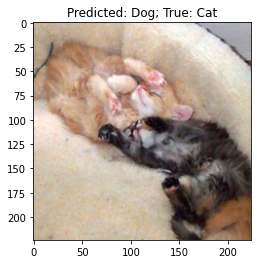

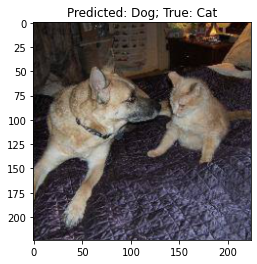

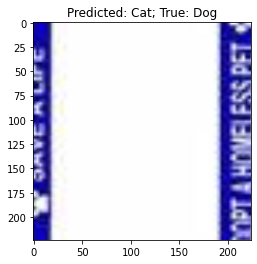

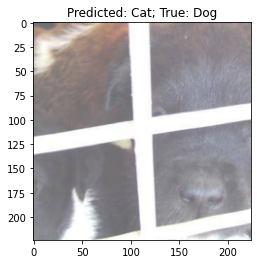

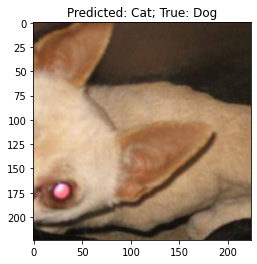

Test Accuracy: 98.60%


tensor([False, False, False,  ...,  True,  True,  True], device='cuda:0')

In [ ]:
print('Test Accuracy for ResNet50 Experiment Unfrozen\n\n')
print('Misclassified:\n')
# calculate test accuracy and obtain label predictions
test_accuracy, predictions = test(resnet, test_dataloader)
print(f'Test Accuracy: {100 * test_accuracy:.2f}%')
# predictions is populated in batches, so we are concatenating
# the results
predictions = torch.stack(predictions)
# flatten stacked results into a 1D array
predictions = predictions.reshape(1, -1).squeeze()
predictions.to(device)

## Plot Samples

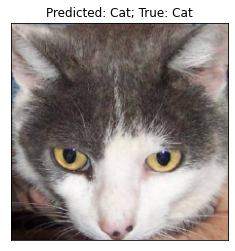

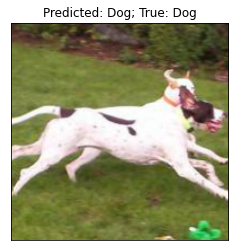

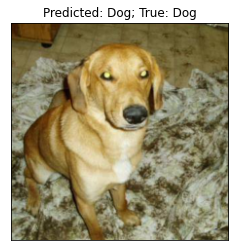

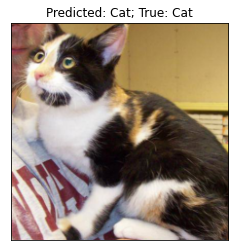

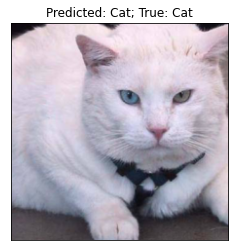

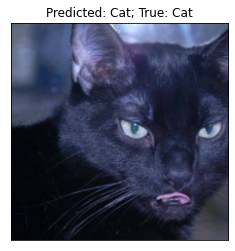

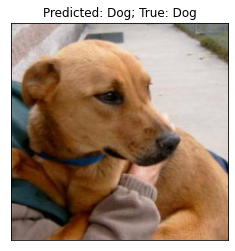

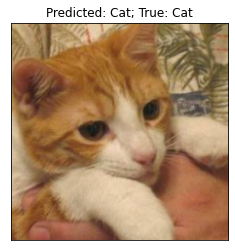

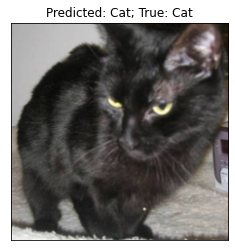

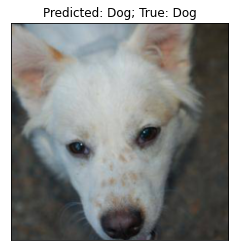

In [ ]:
# get 10 random indices for test data
sample_indices = torch.randint(len(test_set), (10,)).to(device)
# obtain subset of test data using the generated sample_indices
sample_test_data = Subset(test_set, sample_indices)
# wrap dataloader around sample_test_data
sample_test_dataloader = DataLoader(sample_test_data, batch_size=1, shuffle=False)
# obtain subset of predictions for test data samples
sample_predictions = torch.index_select(predictions, 0, sample_indices)
sample_predictions = ['Dog' if l == 1 else 'Cat' for l in sample_predictions]

# enumerate samples for visualization
samples = enumerate(sample_test_dataloader)

# visualize the 10 test data points randomly selected and plot the image with
# the predicted and true labels
for i in range(10):
  batch_idx, (img, label) = next(samples)
  plt.imshow(img[0].permute(1,2,0))
  label_val = 'Dog' if label[0] == 1 else 'Cat'
  plt.title("Predicted: {}".format(sample_predictions[i]) + 
            "; True: {}".format(label_val))
  plt.xticks([])
  plt.yticks([])
  plt.show()

# ResNet50 Experiments Discussion

The two transfer learning experiments performed on ResNet50 with the cats and dogs dataset involved replacing the only FC layer with just one new layer and sigmoid activation in one instance and adding two FC layers with sigmoid activation in the other instance. In both instances, the model performed better after fine-tuning with all the layers unfrozen, demonstrating that while ImageNet weights transfer well to the cats and dogs data, fine-tuning them even in the convolutional layers achieves a higher accuracy than only fine-tuning the classifier layers. The model performs essentially equally well in both instances, which may be because it is already achieving such a high accuracy that adding a second FC layer only reaffirms its predictions rather than help it learn the data further. Nonetheless, achieving accuracies over 99% is excellent and we can safely say it performs really well on this data after fine-tuning.

# Overall Discussion

We experimented with network surgery on two different models: VGG16 and ResNet50. The results show that ResNet50 performs better on classifying the cats and dogs data, which is likely a consequence of having more convolutional layers. Nonetheless, VGG16 also performs really well, achieving accuracies close to 99%, while ResNet50 achieves accuracies over 99%. In all instances, the models perform better when all the layers are fine-tuned on the data, which is logical. Overall, both of these models, pretrained on ImageNet and fine-tuned on cats and dogs data, are excellent for classifying images of cats and dogs, and demonstrate the usefulness of transfer learning.